In [1]:
from importlib import reload
import sys
import os
sys.path.insert(0, './..')
sys.path.insert(0, './../scripts')

In [2]:
from importlib import reload

import pickle
import time

import numpy as np
from scipy import linalg
from scipy import sparse

import matplotlib.pyplot as plt

import plot_func as pf
import util_func as uf

import dev_ori_sel_RF
from dev_ori_sel_RF import data_dir,network,connectivity,dynamics_np
from dev_ori_sel_RF.tools import misc,update_params_dict,gen_gaussian_random_field

2023-09-20 21:51:04.011573: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Please install GPU version of TF


# Define functions to simulate dynamics

In [3]:
from scipy.integrate import solve_ivp

def fio_rect(x):
#     x[x<0] = 0
#     return x
    return np.fmax(x,0)

def dynamics_system(y,inp_ff,Wrec,\
                    gamma_rec,gamma_ff,N,tau):
#     argE = gamma_rec * np.dot(Wrec[:N],y) + gamma_ff * inp_ff[0]
#     argI = gamma_rec * np.dot(Wrec[N:],y) + gamma_ff * inp_ff[1]
#     return 1./tau*( -y + fio_rect(np.concatenate([argE,argI])))
    arg = gamma_rec * np.dot(Wrec,y) + gamma_ff * inp_ff.flatten()
    return 1./tau*( -y + fio_rect(arg))

def integrate(y0,inp,dt,Nt,Wrec,gamma_rec=1.02):
    y = y0
    for t_idx in range(Nt):
        out = dynamics_system(y,inp,Wrec,gamma_rec,1.0,N4*N4,1.0)
        dy = out
        y = y + dt*dy
    return np.array([y[:N4**2].reshape((N4,N4)),y[N4**2:].reshape((N4,N4))])
#     def ode_fun(t,y):
#         return dynamics_system(y,inp,W4to4,gamma_rec,1.0,N4*N4,1.0)
#     sol = solve_ivp(ode_fun,[0,dt*Nt],y0,method='RK23',first_step=dt)
#     return np.array([sol.y[:N4**2,-1].reshape((N4,N4)),sol.y[N4**2:,-1].reshape((N4,N4))])

# Construct heterogeneous recurrent weights

In [6]:
config_name = "big_hetero"
Version = -1
config_dict,N4pop,Nlgnpop,Nret,Nlgn,N4,rA = uf.get_network_size(config_name)

# W4 = connectivity.Connectivity_2pop((N4,N4),(N4,N4),\
#                                     (N4,N4), (N4,N4),\
#                                     random_seed=config_dict["random_seed"],\
#                                     Nvert=1, verbose=True)

# start = time.process_time()

# W4to4,arbor4to4 = W4.create_matrix_2pop(config_dict["W4to4_params"],config_dict["W4to4_params"]["Wrec_mode"])

# print('Creating heterogeneous recurrent connectivity took',time.process_time() - start,'s')
# np.save('hetero_W4to4_N4={:d}'.format(N4),W4to4)

W4to4 = np.load('hetero_W4to4_N4={:d}.npy'.format(N4))

MISC params_dict params_big_hetero {'Nret': 60, 'Nlgn': 60, 'N4': 60, 'N23': 1, 'Nvert': 1, 'runtime': 32000, 'dt': 0.05, 'tau': 1.0, 'num_lgn_paths': 4, 'gamma_lgn': 4.0, 'gamma_4': 1.0, 'gamma_23': 1.0, 'learning_rate_decay_const': 160000.0, 'saving_stepsize': 10, 'plasticity_rule': 'activity_based', 'random_seed': 19, 'nonlinearity_l4': 'rectifier', 'nonlinearity_l23': 'rectifier', 'integrator': 'Euler', 'test_lowDsubset': False, 'developing_params': [], 'Inp_params': {'ndim': 25, 'radius': 3.0, 'width': 1.0, 'simulate_activity': 'dynamics', 'pattern_duration': 2500, 'avg_no_inp': 1, 'expanse_time': 1, 'init_radius': 0.3, 'mean_width': 0.3, 'onoff_corr_factor': 1.0, 'onoff_rel_weight': 1.0, 'input_type': 'white_noise_online', 'off_bias_strength': 0.0, 'off_bias_region_size': 0.5}, 'Wret_to_lgn_params': {'sigma1': 0.01125, 'sigma2': 0.03, 'ampl1': 2.0, 'ampl2': 1.0, 'gamma_ret': 1.0, 'noise': 0.0, 'sigma': 0.016875, 'ampl': 1.0, 'profile': 'Gaussian', 'mean_eccentricity': 0.6, 'SD_ec

Text(0.5, 1.0, 'L2/3 I Cell (Pre)')

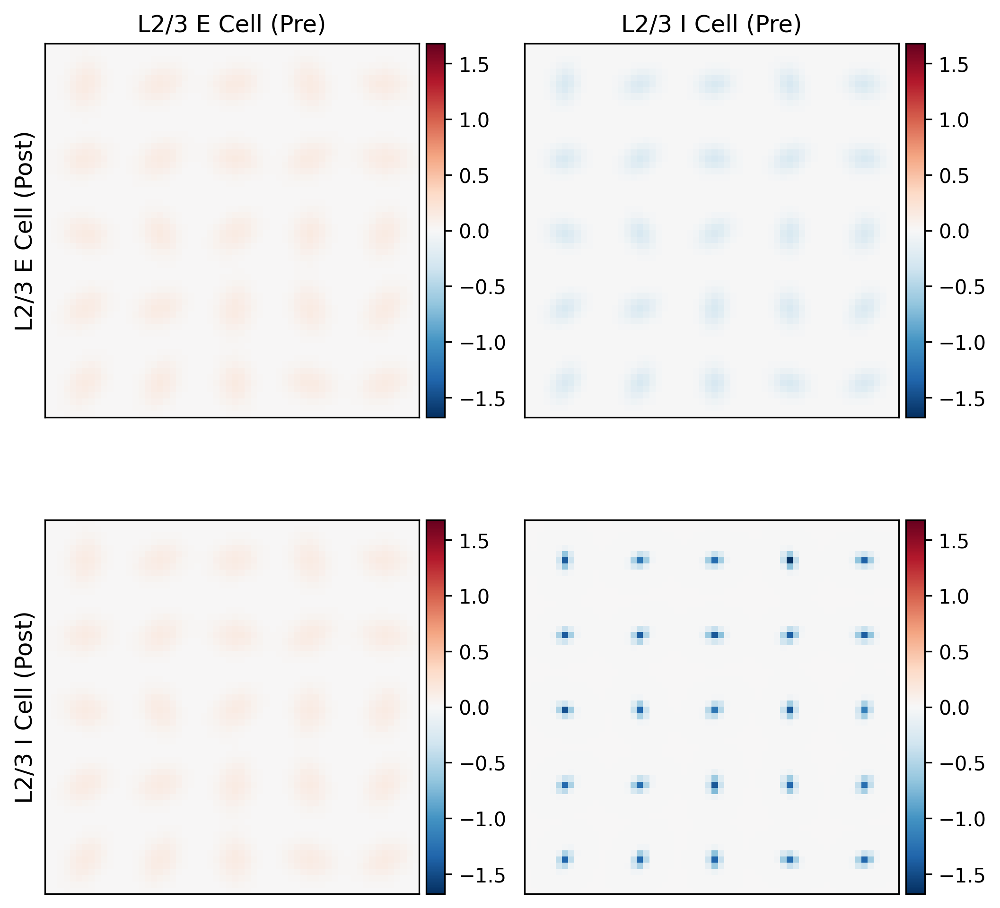

In [5]:
fig,axs = plt.subplots(2,2,figsize=(8,8),dpi=300)
fig.subplots_adjust(hspace=.2, wspace=.2)

WEE = np.zeros((N4,N4))
WEI = np.zeros((N4,N4))
WIE = np.zeros((N4,N4))
WII = np.zeros((N4,N4))

idxs = np.arange(N4//10,N4,N4//5)
for i in range(len(idxs)):
    for j in range(len(idxs)):
        rav_idx = np.ravel_multi_index([[idxs[i]],[idxs[j]]],(N4,N4))
        WEE += W4to4[:N4**2,:N4**2][:,rav_idx].reshape(N4,N4)
        WEI += W4to4[:N4**2,N4**2:][:,rav_idx].reshape(N4,N4)
        WIE += W4to4[N4**2:,:N4**2][:,rav_idx].reshape(N4,N4)
        WII += W4to4[N4**2:,N4**2:][:,rav_idx].reshape(N4,N4)

pf.imshowbar(fig,axs[0,0],WEE,
            vmin=-np.max(np.abs(W4to4)),vmax=np.max(np.abs(W4to4)),cmap='RdBu_r')
pf.imshowbar(fig,axs[0,1],WEI,
            vmin=-np.max(np.abs(W4to4)),vmax=np.max(np.abs(W4to4)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,0],WIE,
            vmin=-np.max(np.abs(W4to4)),vmax=np.max(np.abs(W4to4)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,1],WII,
            vmin=-np.max(np.abs(W4to4)),vmax=np.max(np.abs(W4to4)),cmap='RdBu_r')

axs[0,0].set_ylabel('L2/3 E Cell (Post)',fontsize=12)
axs[1,0].set_ylabel('L2/3 I Cell (Post)',fontsize=12)
axs[0,0].set_title('L2/3 E Cell (Pre)',fontsize=12)
axs[0,1].set_title('L2/3 I Cell (Pre)',fontsize=12)

# eigval,eigvec = sparse.linalg.eigs(W4to4,1,which='LR')
# print(eigval)

# Construct Quasi-Periodic OPM for L4

In [6]:
def gen_qp_opm(sf,nk,seed=0):
    rng = np.random.default_rng(seed)
    
    x,y = np.meshgrid(np.arange(N4)/N4,np.arange(N4)/N4)

    z = np.zeros_like(x)
    
    for j in range(nk):
        fj = np.array([np.round(sf*np.cos(j*np.pi/nk)),
                       np.round(sf*np.sin(j*np.pi/nk))])
        sj = rng.choice([1,-1])
        phij = rng.random()*2*np.pi
        tmp = 2*np.pi*(x*fj[0]+y*fj[1])*sj + phij
        z = z + np.exp(1j * tmp)
        
    return z / nk

In [7]:
def ccw(A,B,C):
    return (C[1]-A[1]) * (B[0]-A[0]) > (B[1]-A[1]) * (C[0]-A[0])

def intersect(A,B,C,D):
    return ccw(A,C,D) != ccw(B,C,D) and ccw(A,B,C) != ccw(A,B,D)

def cross(A,B):
    return A[0]*B[1] - A[1]*B[0]

def intersectpt(A,B,C,D):
    qmp = [C[0]-A[0],C[1]-A[1]]
    r = [B[0]-A[0],B[1]-A[1]]
    s = [D[0]-C[0],D[1]-C[1]]
    rxs = cross(r,s)
    
    t = cross(qmp,s)/rxs
#     u = cross(qmp,r)/rxs
    
    return [A[0]+t*r[0],A[1]+t*r[1]]

In [8]:
z = gen_qp_opm(4,8)

Text(0.5, 1.0, 'Orientation Selectivity Map')

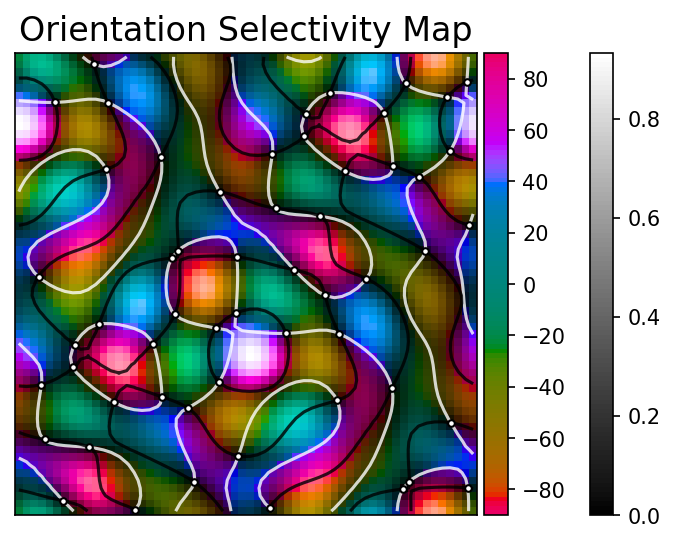

In [9]:
fig,axs = plt.subplots(1,1,figsize=(6,4),dpi=150)

pf.domcolbar(fig,axs,z,origin='lower',alim=[-90,90],rlim=[0,None],zorder=0)
rcont = axs.contour(np.real(z),levels=[0],colors="w",alpha=0.8,zorder=1)
icont = axs.contour(np.imag(z),levels=[0],colors="k",alpha=0.8,zorder=1)

rsegpts = []
for pts in rcont.allsegs[0]:
    for i in range(len(pts)-1):
        rsegpts.append([pts[i],pts[i+1]])
rsegpts = np.array(rsegpts)

isegpts = []
for pts in icont.allsegs[0]:
    for i in range(len(pts)-1):
        isegpts.append([pts[i],pts[i+1]])
isegpts = np.array(isegpts)

pwpts = []

for rsegpt in rsegpts:
    for isegpt in isegpts:
        if intersect(rsegpt[0],rsegpt[1],isegpt[0],isegpt[1]):
            pwpts.append(intersectpt(rsegpt[0],rsegpt[1],isegpt[0],isegpt[1]))
pwpts = np.array(pwpts)

axs.scatter(pwpts[:,0],pwpts[:,1],s=10,c='w',edgecolors='k',zorder=2)

axs.set_title('Orientation Selectivity Map',fontsize=16)

# Generate inputs

In [10]:
avg_OS = 0.15
avg_FF = 0.4

## Generate inputs with correct average OS

Text(0.5, 1.0, '$\\theta = 135^\\circ$')

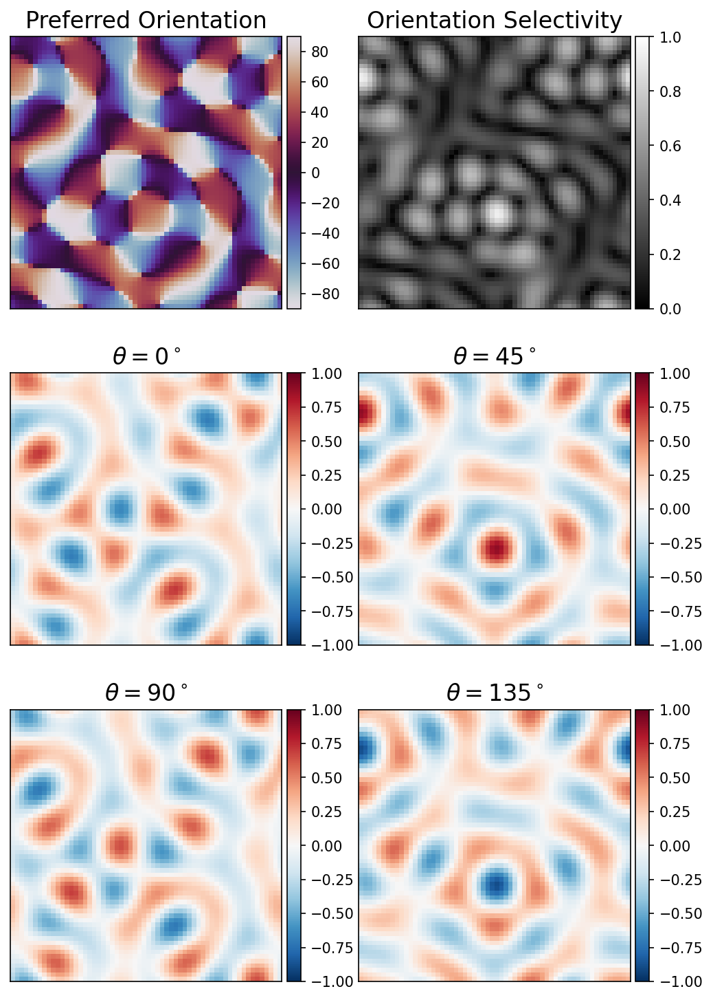

In [11]:
fig,axs = plt.subplots(3,2,figsize=(8,12),dpi=150)

pf.imshowbar(fig,axs[0,0],np.angle(z)*180/(2*np.pi),origin='lower',cmap='twilight',vmin=-90,vmax=90)

pf.imshowbar(fig,axs[0,1],np.abs(z),origin='lower',cmap='binary_r',vmin=0,vmax=1)

pf.imshowbar(fig,axs[1,0],np.real(np.exp(-1j*  0      ) * z),origin='lower',cmap='RdBu_r',
            vmin=-1,vmax=1)
pf.imshowbar(fig,axs[1,1],np.real(np.exp(-1j*  np.pi/2) * z),origin='lower',cmap='RdBu_r',
            vmin=-1,vmax=1)
pf.imshowbar(fig,axs[2,0],np.real(np.exp(-1j*  np.pi  ) * z),origin='lower',cmap='RdBu_r',
            vmin=-1,vmax=1)
pf.imshowbar(fig,axs[2,1],np.real(np.exp(-1j*3*np.pi/2) * z),origin='lower',cmap='RdBu_r',
            vmin=-1,vmax=1)

axs[0,0].set_title('Preferred Orientation',fontsize=16)
axs[0,1].set_title('Orientation Selectivity',fontsize=16)
axs[1,0].set_title(r'$\theta = 0^\circ$',fontsize=16)
axs[1,1].set_title(r'$\theta = 45^\circ$',fontsize=16)
axs[2,0].set_title(r'$\theta = 90^\circ$',fontsize=16)
axs[2,1].set_title(r'$\theta = 135^\circ$',fontsize=16)

In [12]:
n_inp = 25
oris = np.zeros(n_inp)
inps = np.zeros((n_inp,N4,N4))

# ring_image = np.fft.fftshift(gen_gaussian_random_field.generate_ring(N4,N4,0,N4/4))

rng = np.random.default_rng(0)
for inp_idx in range(n_inp):
    ori = inp_idx/n_inp*180
    oris[inp_idx] = ori
    mean_resp = 1 + 2*avg_OS * np.real(np.exp(1j*ori*2*np.pi/180) * z) / np.mean(np.abs(z))
    inps[inp_idx,:,:] = mean_resp

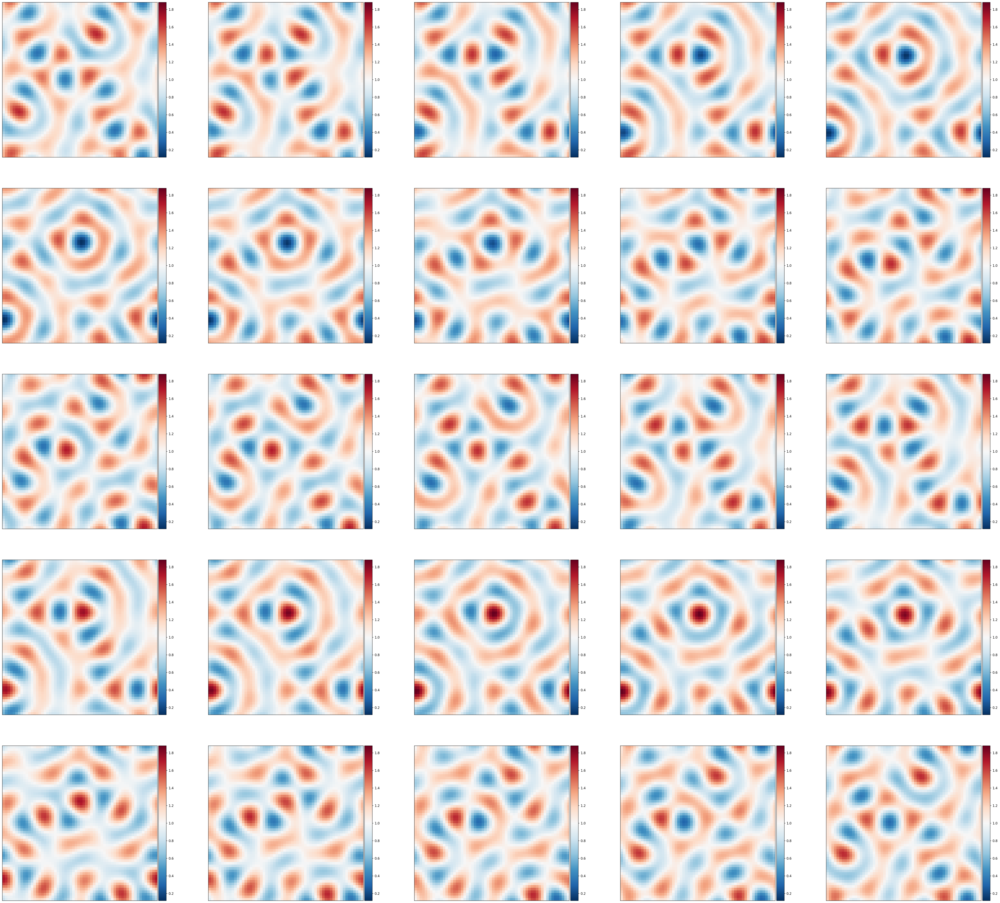

In [13]:
n_row = 5

fig,axs = plt.subplots(n_row,n_row,figsize=(55,50),dpi=150)

for i in range(n_row):
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     inps[idx],cmap='RdBu_r',
                     vmin=np.min(inps[:]),vmax=np.max(inps[:]))

Text(0.5, 1.0, 'Variance of Input')

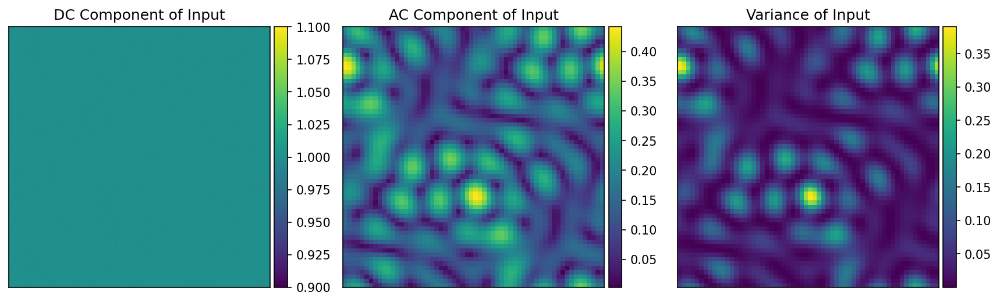

In [14]:
fig,axs = plt.subplots(1,3,figsize=(14,4),dpi=150)

r0 = np.mean(inps,0)
r1 = np.sqrt(np.mean(np.sin(oris*2*np.pi/180)[:,None,None]*inps,0)**2 +\
        np.mean(np.cos(oris*2*np.pi/180)[:,None,None]*inps,0)**2)
rV = np.var(inps,0)

pf.imshowbar(fig,axs[0],r0,origin='lower',cmap='viridis')
pf.imshowbar(fig,axs[1],r1,origin='lower',cmap='viridis')
pf.imshowbar(fig,axs[2],rV,origin='lower',cmap='viridis')

axs[0].set_title('DC Component of Input')
axs[1].set_title('AC Component of Input')
axs[2].set_title('Variance of Input')

In [15]:
print('Avg OS =',np.mean(r1/r0))
print('Variance from Orientation =',np.mean(rV))
ori_var = np.mean(rV)

Avg OS = 0.15
Variance from Orientation = 0.056041445528154855


## Generate inputs with correct FF

In [16]:
n_inp = 100
oris = np.zeros(n_inp)
inps = np.zeros((n_inp,N4,N4))

# ring_image = np.fft.fftshift(gen_gaussian_random_field.generate_ring(N4,N4,0,N4/4))

rng = np.random.default_rng(0)
for inp_idx in range(n_inp):
    ori = 0
    oris[inp_idx] = ori
    mean_resp = 1 + 2*avg_OS * np.real(np.exp(-1j*ori*2*np.pi/180) * z) / np.mean(np.abs(z))
    scale = avg_FF
    shape = mean_resp/avg_FF
#     random_matrix = rng.normal(size=(N4,N4))
#     inps[inp_idx,:,:] = mean_resp + random_matrix*np.sqrt(mean_resp*avg_FF)
    inps[inp_idx,:,:] = rng.gamma(shape=shape,scale=scale)

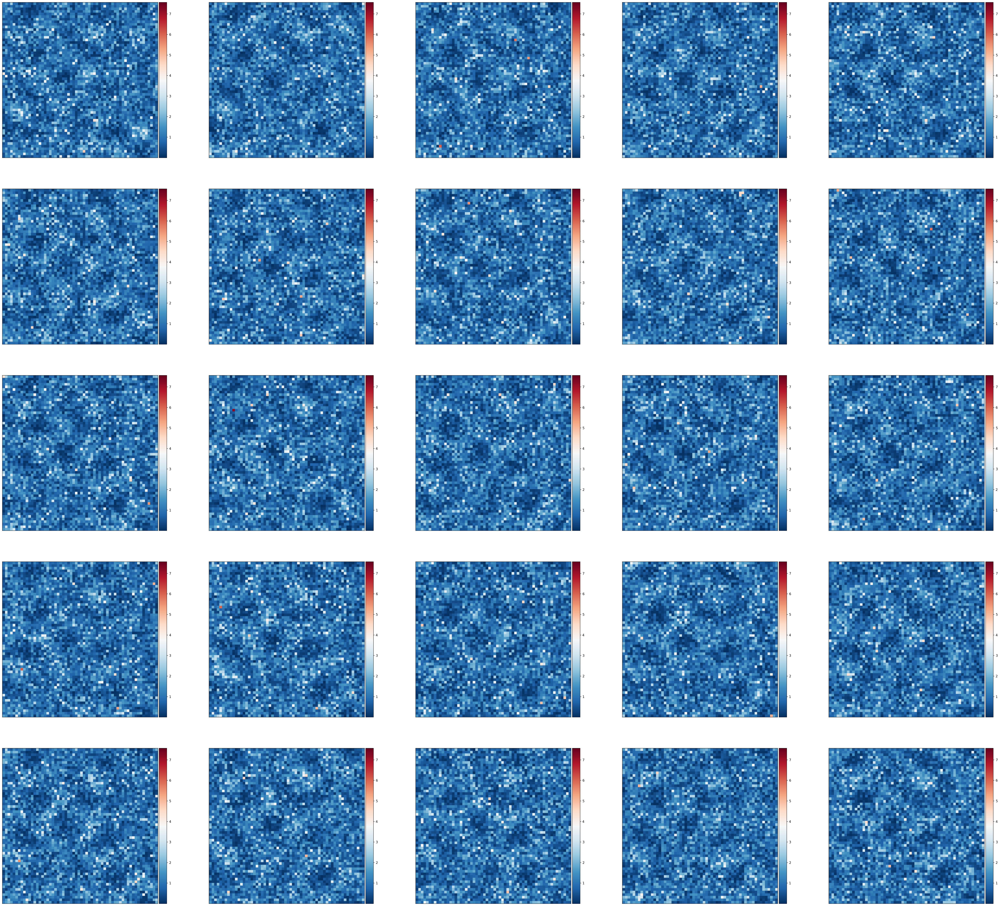

In [17]:
n_row = 5

fig,axs = plt.subplots(n_row,n_row,figsize=(55,50),dpi=150)

for i in range(n_row):
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     inps[idx],cmap='RdBu_r',
                     vmin=np.min(inps[:]),vmax=np.max(inps[:]))

Text(0.5, 1.0, 'Fano Factor of Input')

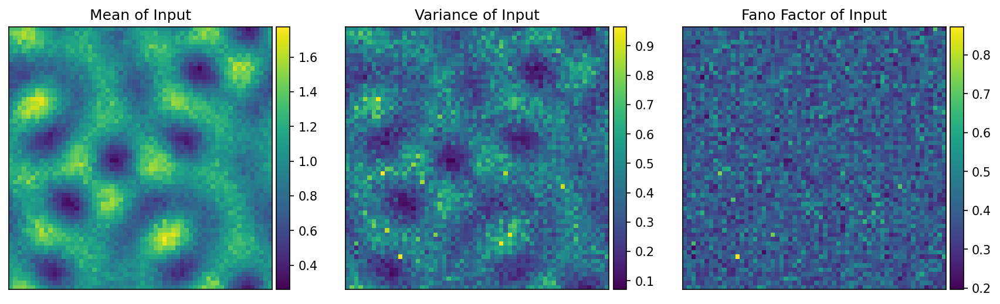

In [18]:
fig,axs = plt.subplots(1,3,figsize=(14,4),dpi=150)

rm = np.mean(inps,0)
rV = np.var(inps,0)

pf.imshowbar(fig,axs[0],rm,origin='lower',cmap='viridis')
pf.imshowbar(fig,axs[1],rV,origin='lower',cmap='viridis')
pf.imshowbar(fig,axs[2],rV/rm,origin='lower',cmap='viridis')

axs[0].set_title('Mean of Input')
axs[1].set_title('Variance of Input')
axs[2].set_title('Fano Factor of Input')

In [19]:
print('Avg FF =',np.mean(rV/rm))

Avg FF = 0.3941534849994139


## Generate full set of inputs

In [20]:
n_inp = 500
oris = np.arange(n_inp)/n_inp * 180
inps = np.zeros((n_inp,2,N4,N4))

# ring_image = np.fft.fftshift(gen_gaussian_random_field.generate_ring(N4,N4,0,N4/4))

rng = np.random.default_rng(0)
for inp_idx in range(n_inp):
    ori = oris[inp_idx]
    mean_resp = 1 + 2*avg_OS * np.real(np.exp(-1j*ori*2*np.pi/180) * z) / np.mean(np.abs(z))
    scale = avg_FF
    shape = mean_resp/avg_FF
    for pop_idx in range(2):
        inps[inp_idx,pop_idx,:,:] = rng.gamma(shape=shape,scale=scale)

In [21]:
r0 = np.mean(inps,0)
r1 = np.sqrt(np.mean(np.sin(oris*2*np.pi/180)[:,None,None,None]*inps,0)**2 +\
        np.mean(np.cos(oris*2*np.pi/180)[:,None,None,None]*inps,0)**2)
print('Avg OS =',np.mean(r1/r0))

rm = np.mean(inps,0)
rV = np.var(inps,0)
print('Avg FF =',np.mean(rV/rm) - ori_var)

Avg OS = 0.15219971397103393
Avg FF = 0.39921184762316886


In [22]:
# rates = np.zeros_like(inps)

# start = time.process_time()

# for inp_idx in range(n_inp):
#     rates[inp_idx] = integrate(np.ones(2*N4**2),inps[inp_idx].reshape((2,-1)),0.25,100,W4to4)
    
# print('Simulating rate dynamics took',time.process_time() - start,'s')
# np.save('L23_rates_qp_map_N4={:d}'.format(N4),rates.flatten())

rates = np.load('L23_rates_qp_map_N4={:d}.npy'.format(N4)).reshape((n_inp,2,N4,N4))

In [23]:
n_row = 5

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=(110,50),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     rates[idx,0],cmap='RdBu_r',
                     vmin=np.min(rates[:,0]),vmax=np.max(rates[:,0]))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     rates[idx,1],cmap='RdBu_r',
                     vmin=np.min(rates[:,1]),vmax=np.max(rates[:,1]))

In [24]:
n_bins = 1
ori_binned = oris.reshape(-1,n_bins).mean(1)
inp_binned = inps.reshape(-1,n_bins,2,N4,N4).mean((1,2))
rate_binned = rates.reshape(-1,n_bins,2,N4,N4).mean((1,2))

In [25]:
r0 = np.mean(rate_binned,0)
rs = np.mean(np.sin(ori_binned*2*np.pi/180)[:,None,None]*rate_binned,0)
rc = np.mean(np.cos(ori_binned*2*np.pi/180)[:,None,None]*rate_binned,0)
r1 = np.sqrt(rs**2 + rc**2)

inp_r0 = np.mean(inp_binned,0)
inp_rs = np.mean(np.sin(ori_binned*2*np.pi/180)[:,None,None]*inp_binned,0)
inp_rc = np.mean(np.cos(ori_binned*2*np.pi/180)[:,None,None]*inp_binned,0)
inp_r1 = np.sqrt(inp_rs**2 + inp_rc**2)
 
pref_ori = np.arctan2(rs,rc)*180/(2*np.pi)
pref_ori[pref_ori > 90] -= 180
alt_pref_ori = ori_binned[rate_binned.argmax(0)]
alt_pref_ori[alt_pref_ori > 90] -= 180
ori_sel = r1/r0
 
inp_pref_ori = np.arctan2(inp_rs,inp_rc)*180/(2*np.pi)
inp_pref_ori[inp_pref_ori > 90] -= 180
inp_alt_pref_ori = ori_binned[inp_binned.argmax(0)]
inp_alt_pref_ori[inp_alt_pref_ori > 90] -= 180
inp_ori_sel = inp_r1/inp_r0

z_field = ori_sel * np.exp(1j*pref_ori*2*np.pi/180)
inp_z_field = inp_ori_sel * np.exp(1j*inp_pref_ori*2*np.pi/180)

Text(0.5, 1.0, 'Orientation Map')

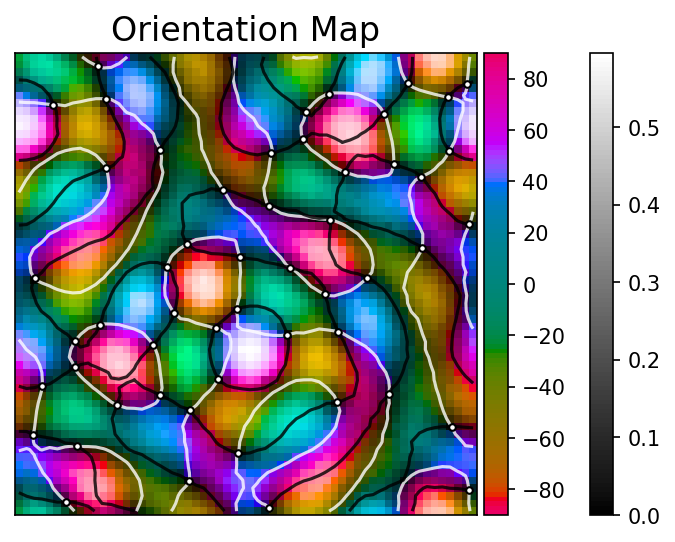

In [26]:
fig,axs = plt.subplots(1,1,figsize=(6,4),dpi=150)

pf.domcolbar(fig,axs,z_field,origin='lower',alim=[-90,90],rlim=[0,None],zorder=0)
rcont = axs.contour(np.real(z_field),levels=[0],colors="w",alpha=0.8,zorder=1)
icont = axs.contour(np.imag(z_field),levels=[0],colors="k",alpha=0.8,zorder=1)

rsegpts = []
for pts in rcont.allsegs[0]:
    for i in range(len(pts)-1):
        rsegpts.append([pts[i],pts[i+1]])
rsegpts = np.array(rsegpts)

isegpts = []
for pts in icont.allsegs[0]:
    for i in range(len(pts)-1):
        isegpts.append([pts[i],pts[i+1]])
isegpts = np.array(isegpts)

pwpts = []

for rsegpt in rsegpts:
    for isegpt in isegpts:
        if intersect(rsegpt[0],rsegpt[1],isegpt[0],isegpt[1]):
            pwpts.append(intersectpt(rsegpt[0],rsegpt[1],isegpt[0],isegpt[1]))
pwpts = np.array(pwpts)

axs.scatter(pwpts[:,0],pwpts[:,1],s=10,c='w',edgecolors='k',zorder=2)

axs.set_title('Orientation Map',fontsize=16)

# Compare L4 vs L2/3 OPM

## Compare maps

Text(0.5, 1.0, 'L2/3 Activity Orientation Selectivity')

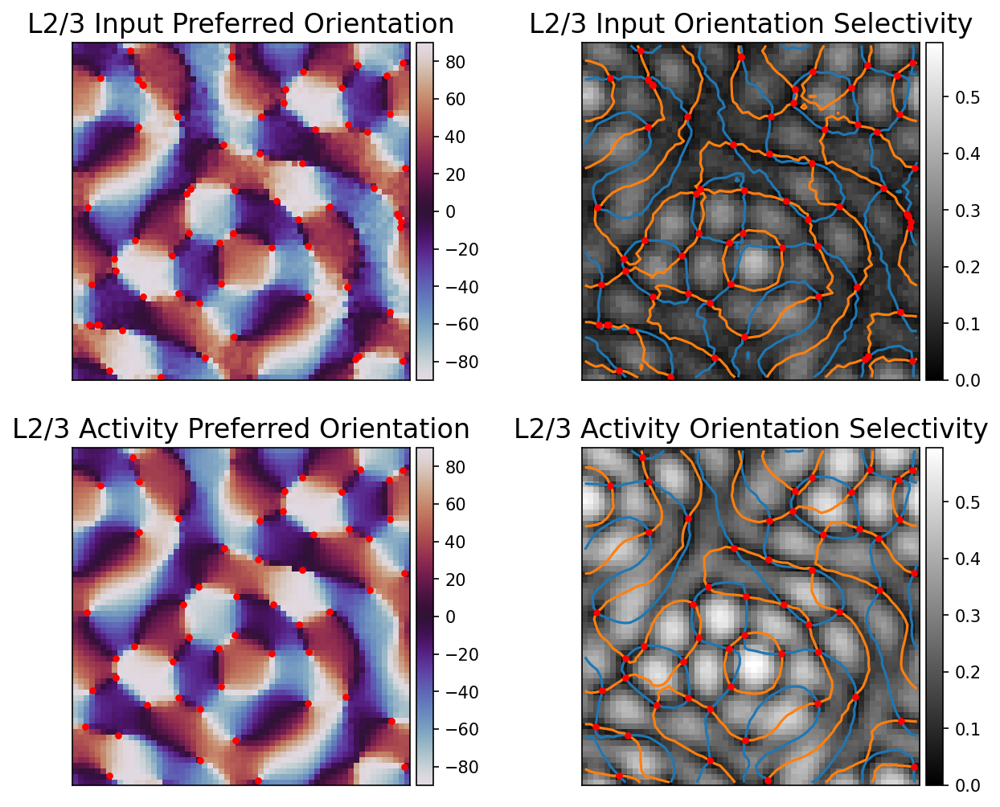

In [27]:
fig,axs = plt.subplots(2,2,figsize=(10,8),dpi=150)

pf.imshowbar(fig,axs[0,0],inp_pref_ori,origin='lower',cmap='twilight',vmin=-90,vmax=90,zorder=0)

pf.imshowbar(fig,axs[0,1],inp_ori_sel,origin='lower',cmap='binary_r',
             vmin=0,vmax=max(np.max(inp_ori_sel),np.max(ori_sel)),zorder=0)
rcont = axs[0,1].contour(np.real(inp_z_field),levels=[0],colors="C0",zorder=1)
icont = axs[0,1].contour(np.imag(inp_z_field),levels=[0],colors="C1",zorder=1)

rsegpts = []
for pts in rcont.allsegs[0]:
    for i in range(len(pts)-1):
        rsegpts.append([pts[i],pts[i+1]])
rsegpts = np.array(rsegpts)

isegpts = []
for pts in icont.allsegs[0]:
    for i in range(len(pts)-1):
        isegpts.append([pts[i],pts[i+1]])
isegpts = np.array(isegpts)

pwpts = []

for rsegpt in rsegpts:
    for isegpt in isegpts:
        if intersect(rsegpt[0],rsegpt[1],isegpt[0],isegpt[1]):
            pwpts.append(intersectpt(rsegpt[0],rsegpt[1],isegpt[0],isegpt[1]))
pwpts = np.array(pwpts)

axs[0,0].scatter(pwpts[:,0],pwpts[:,1],s=10,c='r',zorder=2)
axs[0,1].scatter(pwpts[:,0],pwpts[:,1],s=10,c='r',zorder=2)

pf.imshowbar(fig,axs[1,0],pref_ori,origin='lower',cmap='twilight',vmin=-90,vmax=90,zorder=0)

pf.imshowbar(fig,axs[1,1],ori_sel,origin='lower',cmap='binary_r',
             vmin=0,vmax=max(np.max(inp_ori_sel),np.max(ori_sel)),zorder=0)
rcont = axs[1,1].contour(np.real(z_field),levels=[0],colors="C0",zorder=1)
icont = axs[1,1].contour(np.imag(z_field),levels=[0],colors="C1",zorder=1)

rsegpts = []
for pts in rcont.allsegs[0]:
    for i in range(len(pts)-1):
        rsegpts.append([pts[i],pts[i+1]])
rsegpts = np.array(rsegpts)

isegpts = []
for pts in icont.allsegs[0]:
    for i in range(len(pts)-1):
        isegpts.append([pts[i],pts[i+1]])
isegpts = np.array(isegpts)

pwpts = []

for rsegpt in rsegpts:
    for isegpt in isegpts:
        if intersect(rsegpt[0],rsegpt[1],isegpt[0],isegpt[1]):
            pwpts.append(intersectpt(rsegpt[0],rsegpt[1],isegpt[0],isegpt[1]))
pwpts = np.array(pwpts)

axs[1,0].scatter(pwpts[:,0],pwpts[:,1],s=10,c='r',zorder=2)
axs[1,1].scatter(pwpts[:,0],pwpts[:,1],s=10,c='r',zorder=2)

axs[0,0].set_title('L2/3 Input Preferred Orientation',fontsize=16)
axs[0,1].set_title('L2/3 Input Orientation Selectivity',fontsize=16)
axs[1,0].set_title('L2/3 Activity Preferred Orientation',fontsize=16)
axs[1,1].set_title('L2/3 Activity Orientation Selectivity',fontsize=16)

In [28]:
print('L4 Avg OS =',np.mean(inp_ori_sel))
print('L2/3 Avg OS =',np.mean(ori_sel))

L4 Avg OS = 0.15122887454948333
L2/3 Avg OS = 0.260927585378534


## Look at orientation preference mismatch

In [29]:
opm_mismatch = np.abs(inp_pref_ori - pref_ori)
opm_mismatch[opm_mismatch > 90] = 180 - opm_mismatch[opm_mismatch > 90]

Text(0, 0.5, 'Count')

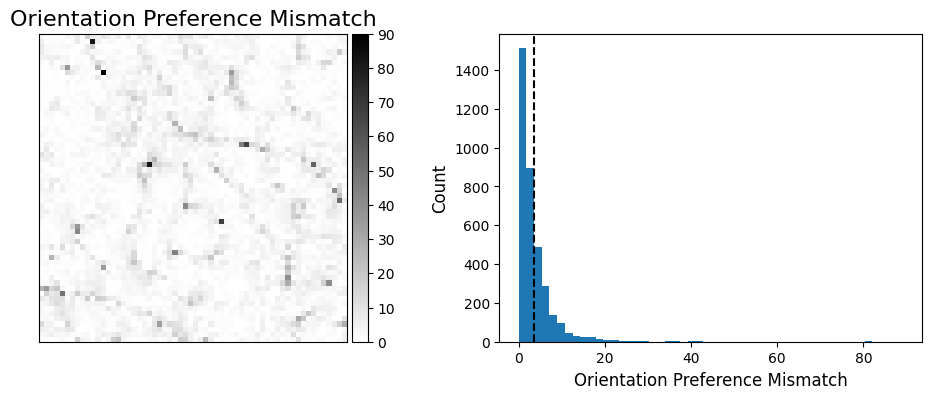

In [30]:
fig,axs = plt.subplots(1,2,figsize=(12,4))

pf.imshowbar(fig,axs[0],opm_mismatch,
             origin='lower',cmap='binary',vmin=0,vmax=90)
axs[1].hist(opm_mismatch.flatten(),50)
axs[1].axvline(np.mean(opm_mismatch),c='k',ls='--')

axs[0].set_title('Orientation Preference Mismatch',fontsize=16)
axs[1].set_xlabel('Orientation Preference Mismatch',fontsize=12)
axs[1].set_ylabel('Count',fontsize=12)

In [31]:
np.mean(opm_mismatch)

3.647995250839346

# Try again but with smoothed S&P map

## Look at transformation of OS due to clipping

In [23]:
OSs = np.linspace(0.0,5000.0,10001)

clip_r0s = np.zeros((len(OSs)))
clip_r1s = np.zeros((len(OSs)))
clip_OSs = np.zeros((len(OSs)))

n_inp = 2000
oris = np.arange(n_inp)/n_inp * 180

for OS_idx,OS in enumerate(OSs):
    act = np.fmax(0,1+2*OS*np.cos(oris*2*np.pi/180))
    clip_r0s[OS_idx] = np.mean(act,0)
    clip_r1s[OS_idx] = np.mean(np.sqrt(np.mean(np.sin(oris*2*np.pi/180)*act,0)**2 +\
                np.mean(np.cos(oris*2*np.pi/180)*act,0)**2))
    clip_OSs[OS_idx] = clip_r1s[OS_idx]/clip_r0s[OS_idx]

In [33]:
def clip_r0(OSs):
    out = np.ones_like(OSs)
    out[OSs > 0.5] = (OSs[OSs > 0.5]*np.sqrt(4-1/OSs[OSs > 0.5]**2)+np.arccos(-0.5/OSs[OSs > 0.5]))/np.pi
    return out
    
def clip_r1(OSs):
    out = OSs.copy()
    out[OSs > 0.5] = (0.25*np.sqrt(4-1/OSs[OSs > 0.5]**2)+OSs[OSs > 0.5]*np.arccos(-0.5/OSs[OSs > 0.5]))/np.pi
    return out

def clip_OS(OSs):
    out = OSs.copy()
    out[OSs > 0.5] = (0.25*np.sqrt(4-1/OSs[OSs > 0.5]**2)+OSs[OSs > 0.5]*np.arccos(-0.5/OSs[OSs > 0.5]))/\
        (OSs[OSs > 0.5]*np.sqrt(4-1/OSs[OSs > 0.5]**2)+np.arccos(-0.5/OSs[OSs > 0.5]))
    out[out > 1] = 1
    return out

In [34]:
thy_clip_OSs = clip_OS(OSs)
thy_clip_r0s = clip_r0(OSs)
thy_clip_r1s = clip_r1(OSs)

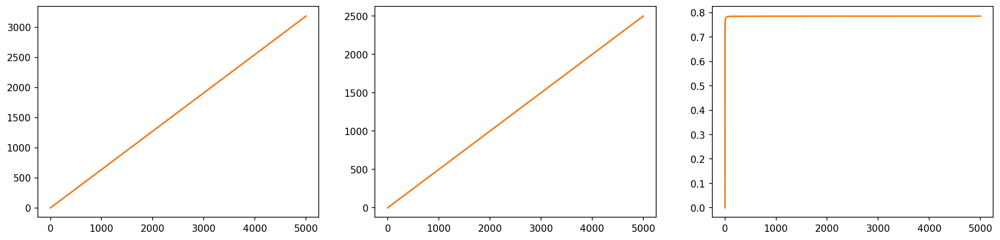

In [35]:
fig,axs = plt.subplots(1,3,figsize=(18,4),dpi=150)

axs[0].plot(OSs,clip_r0s)
axs[0].plot(OSs,thy_clip_r0s)

axs[1].plot(OSs,clip_r1s)
axs[1].plot(OSs,thy_clip_r1s)

axs[2].plot(OSs,clip_OSs)
axs[2].plot(OSs,thy_clip_OSs)

In [36]:
from scipy.interpolate import interp1d

clip_r0_itp = interp1d(OSs,thy_clip_r0s,fill_value='extrapolate')
inv_r1_itp = interp1d(thy_clip_r1s,OSs,fill_value='extrapolate')
inv_OS_itp = interp1d(thy_clip_OSs,OSs,fill_value='extrapolate')

In [37]:
def gen_clip_act(ori,z):
    etas = inv_OS_itp(np.abs(z))
    return np.fmax(0,1 + 2*etas*np.real(np.exp(-1j*ori*2*np.pi/180) * z/np.abs(z))) / clip_r0_itp(etas)

# Generate smoothed S&P OPMs

In [59]:
xs,ys = np.meshgrid(np.arange(N4)/N4,np.arange(N4)/N4)
dxs = np.abs(xs[:,:,None,None] - xs[None,None,:,:])
dxs[dxs > 0.5] = 1 - dxs[dxs > 0.5]
dys = np.abs(ys[:,:,None,None] - ys[None,None,:,:])
dys[dys > 0.5] = 1 - dys[dys > 0.5]
ds2 = dxs**2 + dys**2
ds = np.sqrt(ds2)

In [60]:
def gen_sp_opm(r1,shape,seed=0,tol=1e-2):
    rng = np.random.default_rng(seed)
    
    z = np.exp(1j*2*np.pi*rng.random(size=(N4,N4)))
    
    x = rng.gamma(shape=shape,scale=r1/shape,size=(N4,N4))
    x = clip_OS(x)
    
    z *= x
    
    return z

In [63]:
k = 0.002
avg_OS = 0.15

orig_z = gen_sp_opm(0.15,k)

lker = 0.01
lker2 = lker**2

if lker != 0.0:
    gauss = np.exp(-0.5*ds2/lker2)
else:
    gauss = (ds2 == 0.0).astype(float)
    
z = np.einsum('ijkl,kl->ij',gauss,orig_z * inv_OS_itp(np.abs(orig_z)) / np.fmax(1e-12,np.abs(orig_z)))

# while np.abs(np.mean(clip_OS(np.abs(z))) - avg_OS) > 1e-3:
#     z *= 1 - (np.mean(clip_OS(np.abs(z))) - avg_OS)
while np.abs(np.mean(np.fmin(0.5,np.abs(z))) - avg_OS) > 1e-3:
    z *= 1 - (np.mean(np.fmin(0.5,np.abs(z))) - avg_OS)
#     print(np.abs(np.mean(clip_OS(np.abs(z))) - avg_OS))

# z *= clip_OS(np.abs(z)) / np.fmax(1e-12,np.abs(z))
z *= np.fmin(0.5,np.abs(z)) / np.fmax(1e-12,np.abs(z))

Mean S&P OS = 0.0073471026439107245
Mean Smoothed OS = 0.14900454489201923


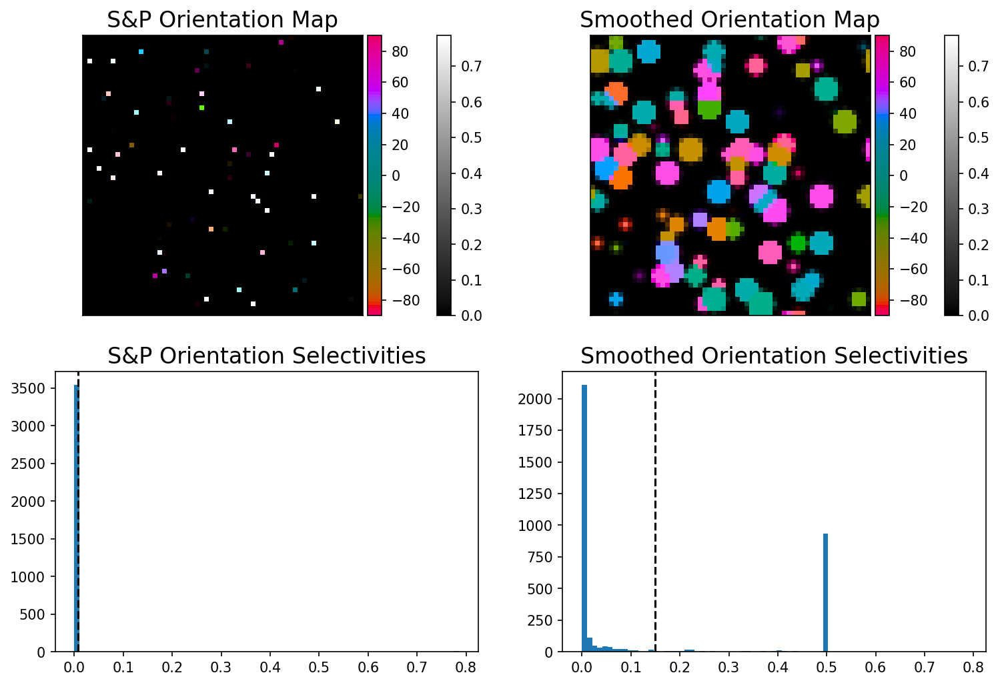

In [64]:
fig,axs = plt.subplots(2,2,figsize=(12,8),dpi=150)

pf.domcolbar(fig,axs[0,0],orig_z,origin='lower',alim=[-90,90],rlim=[0,np.pi/4])
pf.domcolbar(fig,axs[0,1],z,origin='lower',alim=[-90,90],rlim=[0,np.pi/4])
axs[1,0].hist(np.abs(orig_z).flatten(),np.linspace(0,np.pi/4,76))
axs[1,0].axvline(np.mean(np.abs(orig_z)),c='k',ls='--')
axs[1,1].hist(np.abs(z).flatten(),np.linspace(0,np.pi/4,76))
axs[1,1].axvline(np.mean(np.abs(z)),c='k',ls='--')

# axs[1,0].set_yscale('symlog')
# axs[1,1].set_yscale('symlog')

axs[0,0].set_title('S&P Orientation Map',fontsize=16)
axs[0,1].set_title('Smoothed Orientation Map',fontsize=16)
axs[1,0].set_title('S&P Orientation Selectivities',fontsize=16)
axs[1,1].set_title('Smoothed Orientation Selectivities',fontsize=16)

print('Mean S&P OS =',np.mean(np.abs(orig_z)))
print('Mean Smoothed OS =',np.mean(np.abs(z)))

In [42]:
ori = np.angle(z)*180/(2*np.pi)
sel = np.abs(z)
z_unit = z / sel
ori_fft = np.abs(np.fft.fftshift(np.fft.fft2(ori - np.nanmean(ori))))**2
z_unit_fft = np.abs(np.fft.fftshift(np.fft.fft2(z_unit - np.nanmean(z_unit))))**2
# ori_fps = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# z_unit_fps = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
ori_fps = np.zeros(N4//2)
z_unit_fps = np.zeros(N4//2)

grid = np.arange(-N4//2,N4//2)
x,y = np.meshgrid(grid,grid)
bin_idxs = np.digitize(np.sqrt(x**2+y**2),np.arange(0,np.ceil(N4//2*np.sqrt(2)))+0.5)
for idx in range(N4//2):
    ori_fps[idx] = np.mean(ori_fft[bin_idxs == idx])
    z_unit_fps[idx] = np.mean(z_unit_fft[bin_idxs == idx])

Text(0.5, 1.0, '2D FPS of Normalized Z Field')

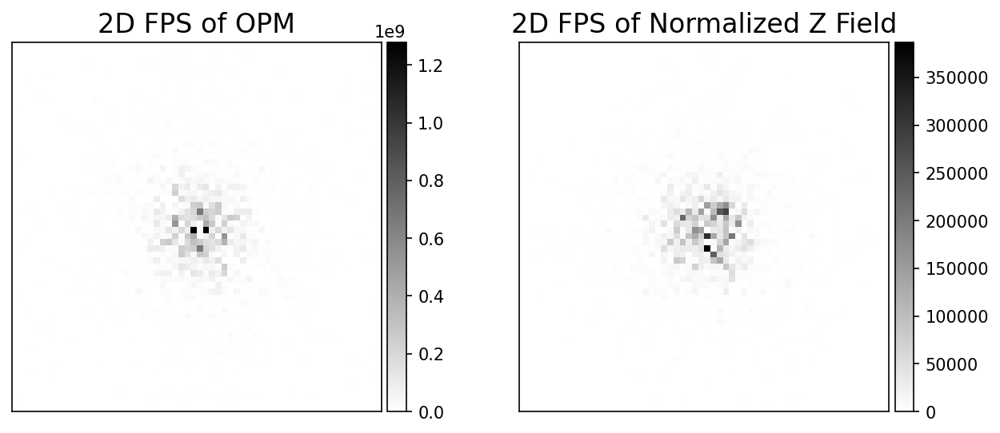

In [43]:
fig,axs = plt.subplots(1,2,figsize=(10,4),dpi=150)

pf.imshowbar(fig,axs[0],ori_fft,cmap='binary')
pf.imshowbar(fig,axs[1],z_unit_fft,cmap='binary')

axs[0].set_title('2D FPS of OPM',fontsize=16)
axs[1].set_title('2D FPS of Normalized Z Field',fontsize=16)

# Generate inputs

In [44]:
avg_OS = 0.15
avg_FF = 0.4

In [45]:
n_inp = 500
gam_rec = 1.02
oris = np.arange(n_inp)/n_inp * 180
mean_inps = np.zeros((n_inp,N4,N4))
inps = np.zeros((n_inp,2,N4,N4))

# ring_image = np.fft.fftshift(gen_gaussian_random_field.generate_ring(N4,N4,0,N4/4))

rng = np.random.default_rng(0)
for inp_idx in range(n_inp):
    ori = oris[inp_idx]
#     mean_inps[inp_idx,:,:] = np.fmax(0,1 + 2*avg_OS *\
#                                              np.real(np.exp(-1j*ori*2*np.pi/180) * z) / np.mean(np.abs(z)))
    mean_inps[inp_idx,:,:] = gen_clip_act(ori,z)
    scale = avg_FF
    shape = mean_inps[inp_idx,:,:]/avg_FF
    for pop_idx in range(2):
        inps[inp_idx,pop_idx,:,:] = rng.gamma(shape=shape,scale=scale)

In [46]:
r0 = np.mean(inps,0)
r1 = np.sqrt(np.mean(np.sin(oris*2*np.pi/180)[:,None,None,None]*inps,0)**2 +\
        np.mean(np.cos(oris*2*np.pi/180)[:,None,None,None]*inps,0)**2)
print('Avg OS =',np.mean(r1/r0))

ori_FF = np.mean(np.var(mean_inps,0) / np.mean(mean_inps,0))

rm = np.mean(inps,0)
rV = np.var(inps,0)
print('Avg FF =',np.mean(rV/rm) - ori_FF)

Avg OS = 0.16689983923221027
Avg FF = 0.39932391994255717


In [47]:
# rates = np.zeros_like(inps)

# start = time.process_time()

# for inp_idx in range(n_inp):
#     rates[inp_idx] = integrate(np.ones(2*N4**2),inps[inp_idx].reshape((2,-1)),0.25,100,W4to4,gam_rec)
    
# print('Simulating rate dynamics took',time.process_time() - start,'s')
# np.save('L23_rates_sp_map_k={:.3f}_lker={:.3f}_gam={:.2f}_N4={:d}'.format(
#     k,lker,gam_rec,N4),rates.flatten())

rates = np.load('L23_rates_sp_map_k={:.3f}_lker={:.3f}_gam={:.2f}_N4={:d}.npy'.format(
    k,lker,gam_rec,N4)).reshape((n_inp,2,N4,N4))

In [48]:
n_row = 5

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=(110,50),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     rates[idx,0],cmap='RdBu_r',
                     vmin=np.min(rates[:,0]),vmax=np.max(rates[:,0]))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     rates[idx,1],cmap='RdBu_r',
                     vmin=np.min(rates[:,1]),vmax=np.max(rates[:,1]))

In [49]:
n_bins = 1
ori_binned = oris.reshape(-1,n_bins).mean(1)
inp_binned = inps.reshape(-1,n_bins,2,N4,N4).mean((1,2))
rate_binned = rates.reshape(-1,n_bins,2,N4,N4).mean(1)

In [50]:
r0 = np.mean(rate_binned,0)
rs = np.mean(np.sin(ori_binned*2*np.pi/180)[:,None,None,None]*rate_binned,0)
rc = np.mean(np.cos(ori_binned*2*np.pi/180)[:,None,None,None]*rate_binned,0)
r1 = np.sqrt(rs**2 + rc**2)

inp_r0 = np.mean(inp_binned,0)
inp_rs = np.mean(np.sin(ori_binned*2*np.pi/180)[:,None,None]*inp_binned,0)
inp_rc = np.mean(np.cos(ori_binned*2*np.pi/180)[:,None,None]*inp_binned,0)
inp_r1 = np.sqrt(inp_rs**2 + inp_rc**2)
 
pref_ori = np.arctan2(rs,rc)*180/(2*np.pi)
pref_ori[pref_ori > 90] -= 180
alt_pref_ori = ori_binned[rate_binned.argmax(0)]
alt_pref_ori[alt_pref_ori > 90] -= 180
ori_sel = r1/r0
 
inp_pref_ori = np.arctan2(inp_rs,inp_rc)*180/(2*np.pi)
inp_pref_ori[inp_pref_ori > 90] -= 180
inp_alt_pref_ori = ori_binned[inp_binned.argmax(0)]
inp_alt_pref_ori[inp_alt_pref_ori > 90] -= 180
inp_ori_sel = inp_r1/inp_r0

z_field = ori_sel * np.exp(1j*pref_ori*2*np.pi/180)
inp_z_field = inp_ori_sel * np.exp(1j*inp_pref_ori*2*np.pi/180)

Text(0.5, 1.0, 'I Orientation Map')

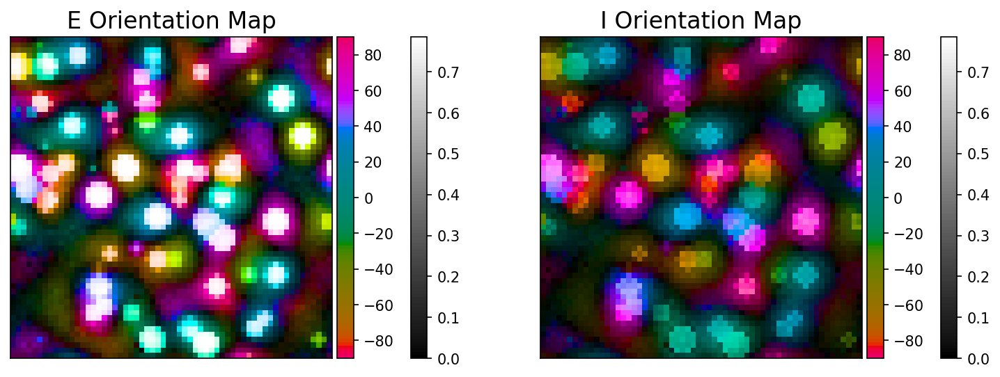

In [51]:
fig,axs = plt.subplots(1,2,figsize=(12,4),dpi=150)

pf.domcolbar(fig,axs[0],z_field[0],origin='lower',alim=[-90,90],rlim=[0,np.pi/4],zorder=0)
pf.domcolbar(fig,axs[1],z_field[1],origin='lower',alim=[-90,90],rlim=[0,np.pi/4],zorder=0)

axs[0].set_title('E Orientation Map',fontsize=16)
axs[1].set_title('I Orientation Map',fontsize=16)

# Compare L4 vs L2/3 OPM

## Compare maps

Text(0.5, 1.0, 'L2/3 I Activity Orientation Selectivity')

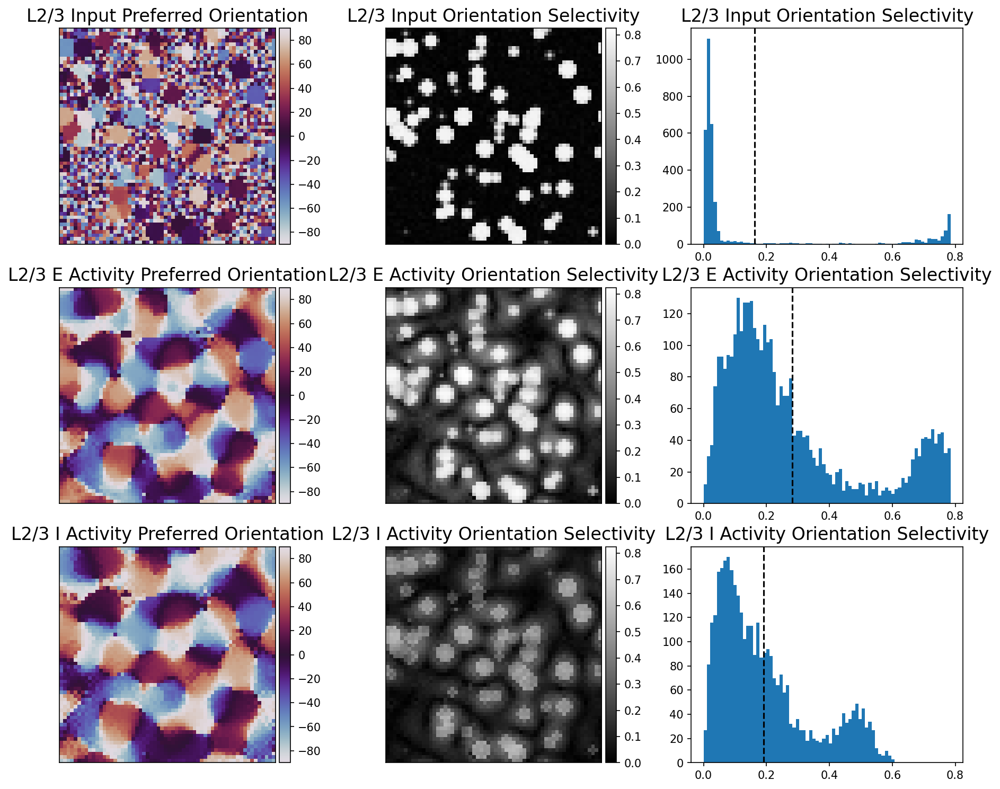

In [52]:
fig,axs = plt.subplots(3,3,figsize=(15,12),dpi=150)

pf.imshowbar(fig,axs[0,0],inp_pref_ori,origin='lower',cmap='twilight',vmin=-90,vmax=90)

pf.imshowbar(fig,axs[0,1],inp_ori_sel,origin='lower',cmap='binary_r',
             vmin=0,vmax=max(np.max(inp_ori_sel),np.max(ori_sel)))

axs[0,2].hist(inp_ori_sel.flatten(),np.linspace(0,np.pi/4,76))
axs[0,2].axvline(np.mean(inp_ori_sel),c='k',ls='--')

pf.imshowbar(fig,axs[1,0],pref_ori[0],origin='lower',cmap='twilight',vmin=-90,vmax=90)

pf.imshowbar(fig,axs[1,1],ori_sel[0],origin='lower',cmap='binary_r',
             vmin=0,vmax=max(np.max(inp_ori_sel),np.max(ori_sel)))

axs[1,2].hist(ori_sel[0].flatten(),np.linspace(0,np.pi/4,76))
axs[1,2].axvline(np.mean(ori_sel[0]),c='k',ls='--')

pf.imshowbar(fig,axs[2,0],pref_ori[1],origin='lower',cmap='twilight',vmin=-90,vmax=90)

pf.imshowbar(fig,axs[2,1],ori_sel[1],origin='lower',cmap='binary_r',
             vmin=0,vmax=max(np.max(inp_ori_sel),np.max(ori_sel)))

axs[2,2].hist(ori_sel[1].flatten(),np.linspace(0,np.pi/4,76))
axs[2,2].axvline(np.mean(ori_sel[1]),c='k',ls='--')

axs[0,0].set_title('L2/3 Input Preferred Orientation',fontsize=16)
axs[0,1].set_title('L2/3 Input Orientation Selectivity',fontsize=16)
axs[0,2].set_title('L2/3 Input Orientation Selectivity',fontsize=16)
axs[1,0].set_title('L2/3 E Activity Preferred Orientation',fontsize=16)
axs[1,1].set_title('L2/3 E Activity Orientation Selectivity',fontsize=16)
axs[1,2].set_title('L2/3 E Activity Orientation Selectivity',fontsize=16)
axs[2,0].set_title('L2/3 I Activity Preferred Orientation',fontsize=16)
axs[2,1].set_title('L2/3 I Activity Orientation Selectivity',fontsize=16)
axs[2,2].set_title('L2/3 I Activity Orientation Selectivity',fontsize=16)

In [53]:
print('L2/3 Input Avg OS =',np.mean(inp_ori_sel))
print('L2/3 E Act Avg OS =',np.mean(ori_sel[0]))
print('L2/3 I Act Avg OS =',np.mean(ori_sel[1]))

L2/3 Input Avg OS = 0.161516664747137
L2/3 E Act Avg OS = 0.28212430858119586
L2/3 I Act Avg OS = 0.19108684500821824


## Look at orientation preference mismatch

In [54]:
opm_mismatch = np.abs(inp_pref_ori - pref_ori)
opm_mismatch[opm_mismatch > 90] = 180 - opm_mismatch[opm_mismatch > 90]

Text(0, 0.5, 'Count')

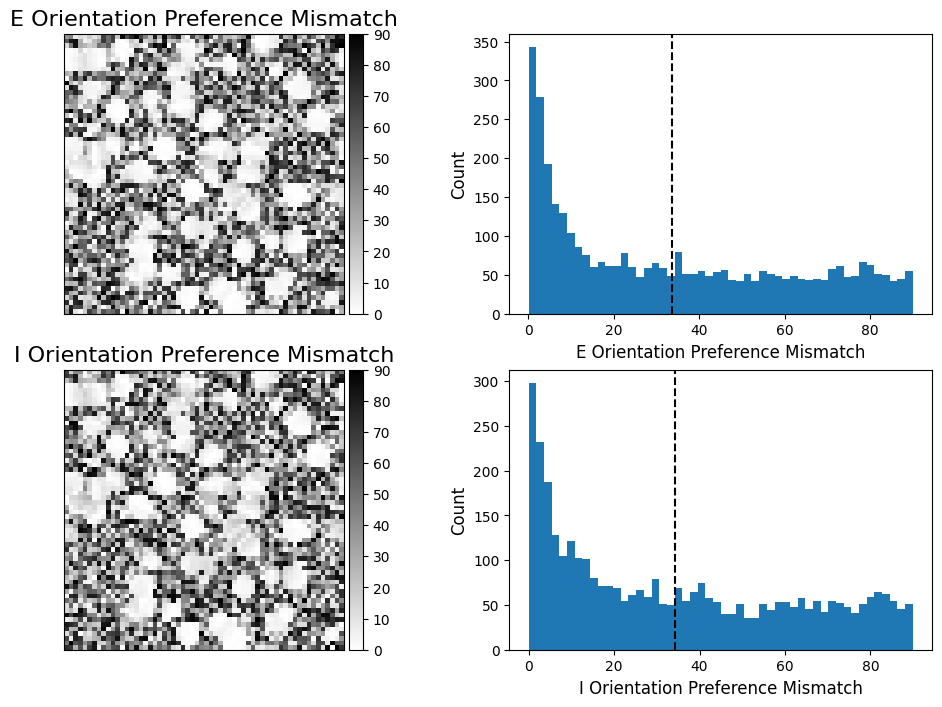

In [55]:
fig,axs = plt.subplots(2,2,figsize=(12,8))

pf.imshowbar(fig,axs[0,0],opm_mismatch[0],
             origin='lower',cmap='binary',vmin=0,vmax=90)
axs[0,1].hist(opm_mismatch[0].flatten(),50)
axs[0,1].axvline(np.mean(opm_mismatch[0]),c='k',ls='--')

pf.imshowbar(fig,axs[1,0],opm_mismatch[1],
             origin='lower',cmap='binary',vmin=0,vmax=90)
axs[1,1].hist(opm_mismatch[1].flatten(),50)
axs[1,1].axvline(np.mean(opm_mismatch[1]),c='k',ls='--')

axs[0,0].set_title('E Orientation Preference Mismatch',fontsize=16)
axs[0,1].set_xlabel('E Orientation Preference Mismatch',fontsize=12)
axs[0,1].set_ylabel('Count',fontsize=12)
axs[1,0].set_title('I Orientation Preference Mismatch',fontsize=16)
axs[1,1].set_xlabel('I Orientation Preference Mismatch',fontsize=12)
axs[1,1].set_ylabel('Count',fontsize=12)

In [56]:
print('L2/3 E Mean Mismatch =',np.mean(opm_mismatch[0]))
print('L2/3 I Mean Mismatch =',np.mean(opm_mismatch[1]))

L2/3 E Mean Mismatch = 33.54329029406894
L2/3 I Mean Mismatch = 34.31606311213407


# Read results of parameter scan

In [80]:
print(ksels[1])
print(lkers[3])
print(grecs[2])

0.0031622776601683794
0.01
1.02


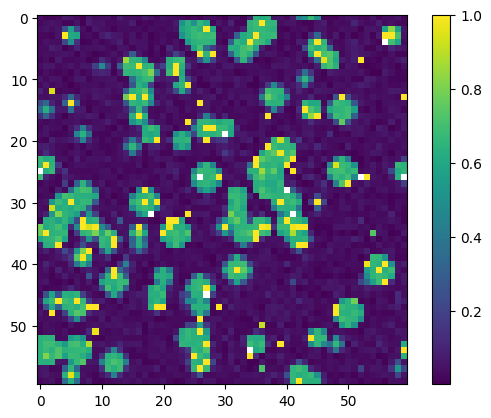

In [82]:
with open('./../results/L23_sel_ssn_ksel={:.3f}_lker={:.3f}_grec={:.3f}_betx={:.2f}_maxos={:.1f}/seed=0.pkl'.format(
        ksels[1],lkers[3],grecs[2],betxs[2],1.0), 'rb') as handle:
    res_dict = pickle.load(handle)
plt.imshow(np.abs(res_dict['rate_r1'])[0]/np.abs(res_dict['rate_r0'])[0])
plt.colorbar()

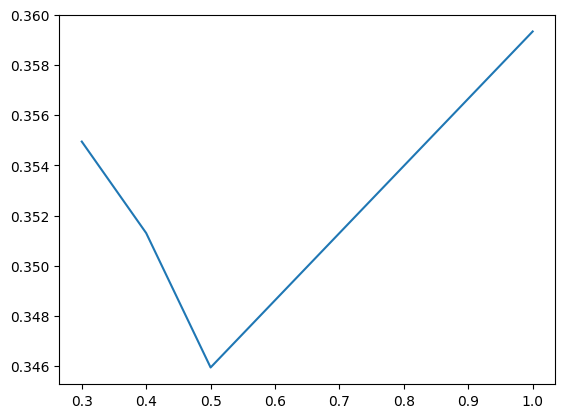

In [107]:
plt.plot(maxoss,E_selects[1,3,2,:])

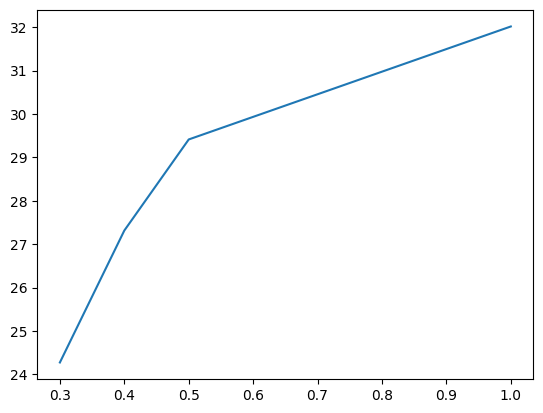

In [108]:
plt.plot(maxoss,mismatches[1,3,2,:])

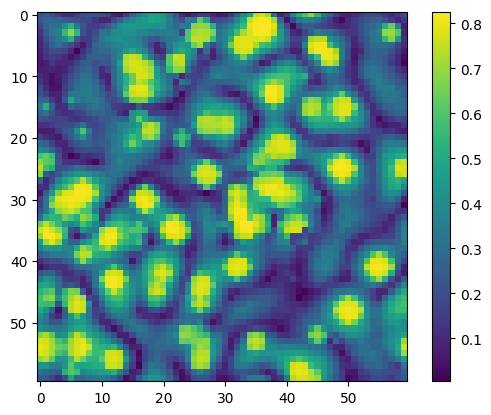

In [93]:
with open('./../results/L23_sel_ksel={:.3f}_lker={:.3f}_grec={:.3f}_maxos={:.1f}/seed=0.pkl'.format(
        ksels[1],lkers[3],grecs[2],1.0), 'rb') as handle:
    res_dict = pickle.load(handle)
plt.imshow(np.abs(res_dict['rate_r1'])[0]/np.abs(res_dict['rate_r0'])[0])
plt.colorbar()

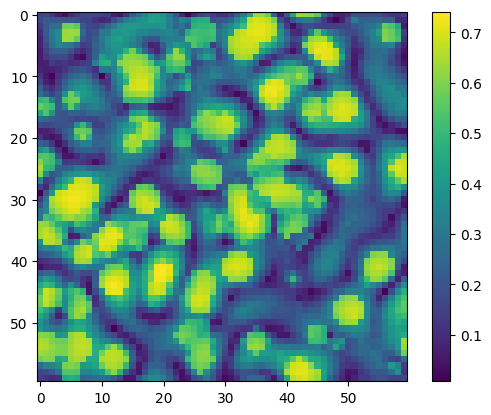

In [92]:
with open('./../results/L23_sel_ksel={:.3f}_lker={:.3f}_grec={:.3f}_maxos={:.1f}/seed=0.pkl'.format(
        ksels[1],lkers[3],grecs[2],0.5), 'rb') as handle:
    res_dict = pickle.load(handle)
plt.imshow(np.abs(res_dict['rate_r1'])[0]/np.abs(res_dict['rate_r0'])[0])
plt.colorbar()

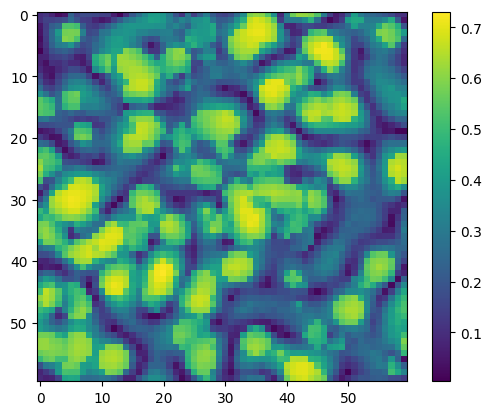

In [91]:
with open('./../results/L23_sel_ksel={:.3f}_lker={:.3f}_grec={:.3f}_maxos={:.1f}/seed=0.pkl'.format(
        ksels[1],lkers[3],grecs[2],0.4), 'rb') as handle:
    res_dict = pickle.load(handle)
plt.imshow(np.abs(res_dict['rate_r1'])[0]/np.abs(res_dict['rate_r0'])[0])
plt.colorbar()

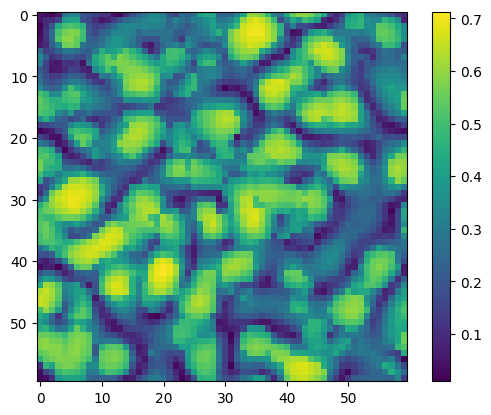

In [94]:
with open('./../results/L23_sel_ksel={:.3f}_lker={:.3f}_grec={:.3f}_maxos={:.1f}/seed=0.pkl'.format(
        ksels[1],lkers[3],grecs[2],0.3), 'rb') as handle:
    res_dict = pickle.load(handle)
plt.imshow(np.abs(res_dict['rate_r1'])[0]/np.abs(res_dict['rate_r0'])[0])
plt.colorbar()

In [101]:
ksels = 10**np.linspace(-3,0,7)
lkers = np.concatenate(([0],10**np.linspace(-3,0,7)[:-1]))
grecs = np.round(1.02*np.linspace(0.95,1.05,5),4)
maxoss = np.array([0.3,0.4,0.5,1.0])

inp_sel_stds = np.zeros((len(ksels),len(lkers),len(grecs),len(maxoss)))
rate_sel_stds = np.zeros((len(ksels),len(lkers),len(grecs),len(maxoss)))
responses = np.zeros((len(ksels),len(lkers),len(grecs),len(maxoss)))
E_selects = np.zeros((len(ksels),len(lkers),len(grecs),len(maxoss)))
I_selects = np.zeros((len(ksels),len(lkers),len(grecs),len(maxoss)))
mismatches = np.zeros((len(ksels),len(lkers),len(grecs),len(maxoss)))

for k_idx,ksel in enumerate(ksels):
    for l_idx,lker in enumerate(lkers):
        for g_idx,grec in enumerate(grecs):
            for m_idx,maxos in enumerate(maxoss):
                with open('./../results/L23_sel_ksel={:.3f}_lker={:.3f}_grec={:.3f}_maxos={:.1f}/seed=0.pkl'.format(
                        ksel,lker,grec,maxos), 'rb') as handle:
                    res_dict = pickle.load(handle)
                inp_sel_stds[k_idx,l_idx,g_idx,m_idx] = np.nanstd(res_dict['inp_r1']/res_dict['inp_r0'])
                if np.isinf(inp_sel_stds[k_idx,l_idx,g_idx,m_idx]):
                    inp_sel_stds[k_idx,l_idx,g_idx,m_idx] = np.nan
                rate_sel_stds[k_idx,l_idx,g_idx,m_idx] = np.nanstd(res_dict['rate_r1'][0]/res_dict['rate_r0'][0])
                if np.isinf(rate_sel_stds[k_idx,l_idx,g_idx,m_idx]):
                    rate_sel_stds[k_idx,l_idx,g_idx,m_idx] = np.nan
                responses[k_idx,l_idx,g_idx,m_idx] = np.nanmean(res_dict['rate_r0'][0]/res_dict['inp_r0'])
                if np.isinf(responses[k_idx,l_idx,g_idx,m_idx]):
                    responses[k_idx,l_idx,g_idx,m_idx] = np.nan
                E_selects[k_idx,l_idx,g_idx,m_idx] = res_dict['E_rate_OS']
                I_selects[k_idx,l_idx,g_idx,m_idx] = res_dict['I_rate_OS']
                mismatches[k_idx,l_idx,g_idx,m_idx] = 0.5*(res_dict['E_mismatch']+res_dict['I_mismatch'])

/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_50979/1727409519.py:20: RuntimeWarning: invalid value encountered in divide
  inp_sel_stds[k_idx,l_idx,g_idx,m_idx] = np.nanstd(res_dict['inp_r1']/res_dict['inp_r0'])
/var/folders/sm/hlw5tfpd0p385cm1782mwjmh0000gq/T/ipykernel_50979/1727409519.py:26: RuntimeWarning: divide by zero encountered in divide
  responses[k_idx,l_idx,g_idx,m_idx] = np.nanmean(res_dict['rate_r0'][0]/res_dict['inp_r0'])


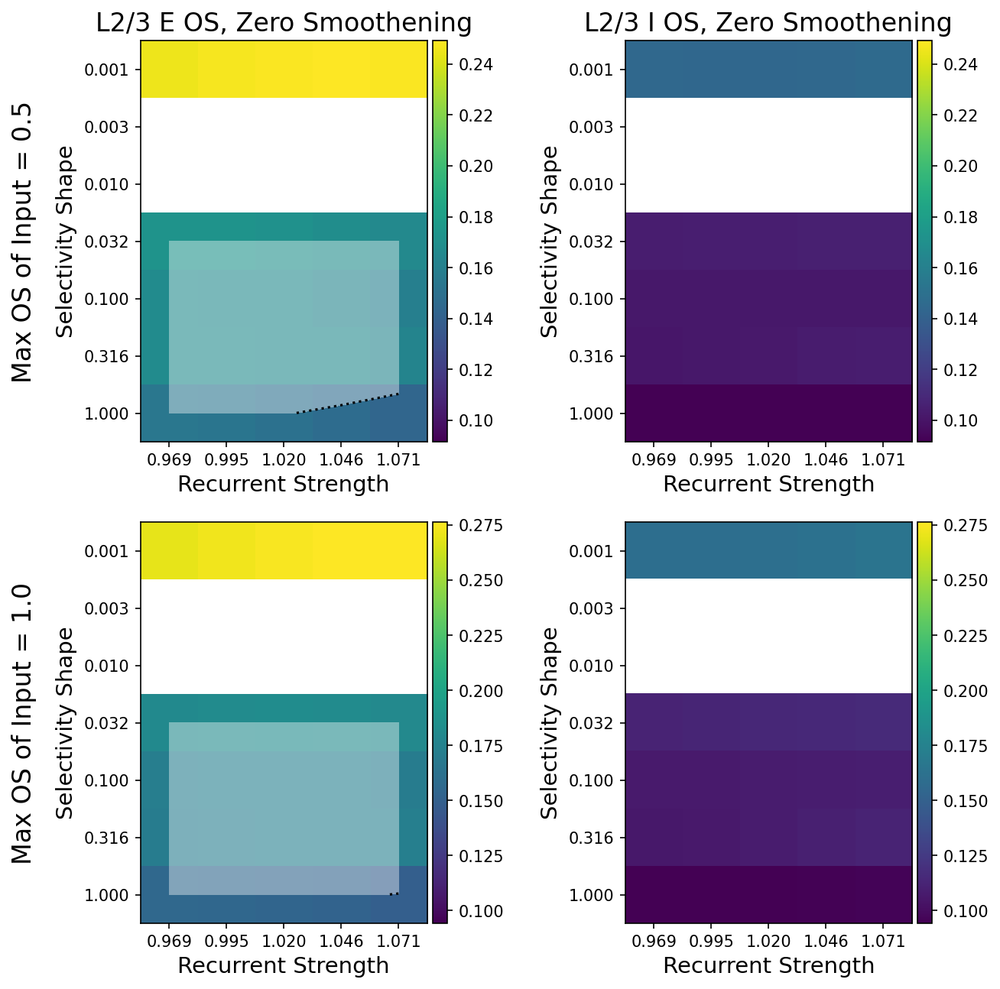

In [102]:
fig,axs = plt.subplots(2,2,figsize=(10,10),dpi=150)

cbar = pf.imshowbar(fig,axs[0,0],E_selects[:,0,:,0],hide_ticks=False,cmap='viridis',
                   vmin=np.nanmin(I_selects[:,0,:,0]),vmax=np.nanmax(E_selects[:,0,:,0]))
axs[0,0].set_xticks(np.arange(len(grecs)),['{:.3f}'.format(grec) for grec in grecs],fontsize=10)
axs[0,0].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
axs[0,0].contourf(E_selects[:,0,:,0],levels=[.15,.3],colors='w',alpha=0.4)
axs[0,0].contour(E_selects[:,0,:,0],levels=[.15],colors='k',linestyles=':')
axs[0,0].set_xlabel('Recurrent Strength',fontsize=14)
axs[0,0].set_ylabel('Selectivity Shape',fontsize=14)

cbar = pf.imshowbar(fig,axs[0,1],I_selects[:,0,:,0],hide_ticks=False,cmap='viridis',
                   vmin=np.nanmin(I_selects[:,0,:,0]),vmax=np.nanmax(E_selects[:,0,:,0]))
axs[0,1].set_xticks(np.arange(len(grecs)),['{:.3f}'.format(grec) for grec in grecs],fontsize=10)
axs[0,1].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
axs[0,1].contourf(I_selects[:,0,:,0],levels=[.15,.3],colors='w',alpha=0.4)
axs[0,1].contour(I_selects[:,0,:,0],levels=[.15],colors='k',linestyles=':')
axs[0,1].set_xlabel('Recurrent Strength',fontsize=14)
axs[0,1].set_ylabel('Selectivity Shape',fontsize=14)

cbar = pf.imshowbar(fig,axs[1,0],E_selects[:,0,:,1],hide_ticks=False,cmap='viridis',
                   vmin=np.nanmin(I_selects[:,0,:,1]),vmax=np.nanmax(E_selects[:,0,:,1]))
axs[1,0].set_xticks(np.arange(len(grecs)),['{:.3f}'.format(grec) for grec in grecs],fontsize=10)
axs[1,0].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
axs[1,0].contourf(E_selects[:,0,:,1],levels=[.15,.3],colors='w',alpha=0.4)
axs[1,0].contour(E_selects[:,0,:,1],levels=[.15],colors='k',linestyles=':')
axs[1,0].set_xlabel('Recurrent Strength',fontsize=14)
axs[1,0].set_ylabel('Selectivity Shape',fontsize=14)

cbar = pf.imshowbar(fig,axs[1,1],I_selects[:,0,:,1],hide_ticks=False,cmap='viridis',
                   vmin=np.nanmin(I_selects[:,0,:,1]),vmax=np.nanmax(E_selects[:,0,:,1]))
axs[1,1].set_xticks(np.arange(len(grecs)),['{:.3f}'.format(grec) for grec in grecs],fontsize=10)
axs[1,1].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
axs[1,1].contourf(I_selects[:,0,:,1],levels=[.15,.3],colors='w',alpha=0.4)
axs[1,1].contour(I_selects[:,0,:,1],levels=[.15],colors='k',linestyles=':')
axs[1,1].set_xlabel('Recurrent Strength',fontsize=14)
axs[1,1].set_ylabel('Selectivity Shape',fontsize=14)

axs[0,0].set_title('L2/3 E OS, Zero Smoothening',fontsize=16)
axs[0,1].set_title('L2/3 I OS, Zero Smoothening',fontsize=16)
pf.ytitle(axs[0,0],'Max OS of Input = 0.5',xloc=-0.45,fontsize=16)
pf.ytitle(axs[1,0],'Max OS of Input = 1.0',xloc=-0.45,fontsize=16)

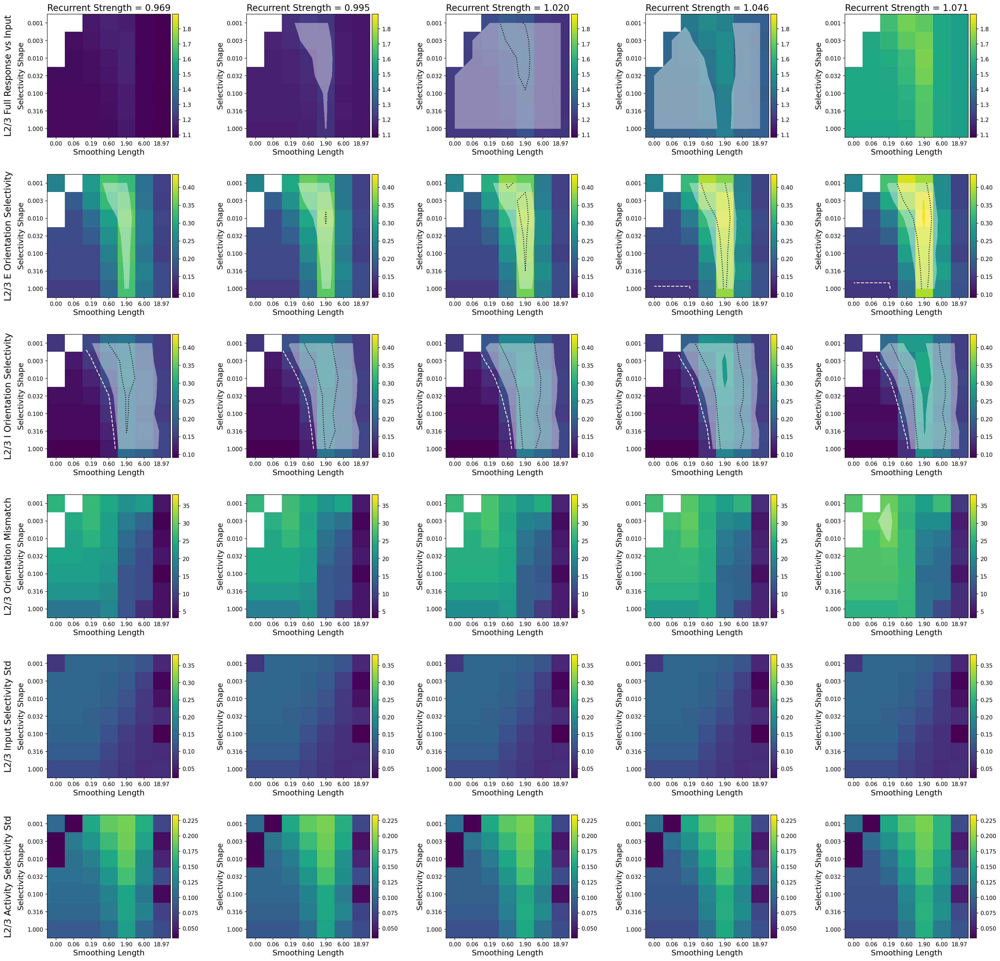

In [103]:
reload(pf)

responses_levels = np.array([1.2,1.3,1.4])
E_selects_levels = np.array([0.32,0.37,0.42])
I_selects_levels = np.array([0.17,0.22,0.27])
mismatches_levels = np.array([30,35,40])

fig,axs = plt.subplots(6,len(grecs),figsize=(6*len(grecs),30),dpi=150)
fig.subplots_adjust(hspace=.3, wspace=.5)

m_idx = 0

for g_idx,grec in enumerate(grecs):
    cbar = pf.imshowbar(fig,axs[0,g_idx],responses[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',#norm='log',
                 vmin=np.nanmin(responses),vmax=np.nanmax(responses))
    axs[0,g_idx].contourf(responses[:,:,g_idx,m_idx],levels=responses_levels[[0,-1]],colors='w',alpha=0.4)
    axs[0,g_idx].contour(responses[:,:,g_idx,m_idx],levels=responses_levels[1:2],colors='k',linestyles=':')
    axs[0,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[0,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[0,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[0,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[1,g_idx],E_selects[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[1,g_idx].contourf(E_selects[:,:,g_idx,m_idx],levels=E_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[1,g_idx].contour(E_selects[:,:,g_idx,m_idx],levels=E_selects_levels[1:2],colors='k',linestyles=':')
    axs[1,g_idx].contour(E_selects[:,:,g_idx,m_idx],levels=[0.15],colors='w',linestyles='--')
    axs[1,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[1,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[1,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[1,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[2,g_idx],I_selects[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[2,g_idx].contourf(I_selects[:,:,g_idx,m_idx],levels=I_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[2,g_idx].contour(I_selects[:,:,g_idx,m_idx],levels=I_selects_levels[1:2],colors='k',linestyles=':')
    axs[2,g_idx].contour(I_selects[:,:,g_idx,m_idx],levels=[0.15],colors='w',linestyles='--')
    axs[2,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[2,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[2,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[2,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[3,g_idx],mismatches[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(mismatches),vmax=np.nanmax(mismatches))
    axs[3,g_idx].contourf(mismatches[:,:,g_idx,m_idx],levels=mismatches_levels[[0,-1]],colors='w',alpha=0.4)
    axs[3,g_idx].contour(mismatches[:,:,g_idx,m_idx],levels=mismatches_levels[1:2],colors='k',linestyles=':')
    axs[3,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[3,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[3,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[3,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[4,g_idx],inp_sel_stds[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(inp_sel_stds),vmax=np.nanmax(inp_sel_stds))
#     axs[4,g_idx].contourf(inp_sel_stds[:,:,g_idx,m_idx],levels=inp_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[4,g_idx].contour(inp_sel_stds[:,:,g_idx,m_idx],levels=inp_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[4,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[4,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[4,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[4,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[5,g_idx],rate_sel_stds[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(rate_sel_stds),vmax=np.nanmax(rate_sel_stds))
#     axs[5,g_idx].contourf(rate_sel_stds[:,:,g_idx,m_idx],levels=rate_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[5,g_idx].contour(rate_sel_stds[:,:,g_idx,m_idx],levels=rate_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[5,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[5,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[5,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[5,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    axs[0,g_idx].set_title('Recurrent Strength = {:.3f}'.format(grec),fontsize=16)
    
pf.ytitle(axs[0,0],'L2/3 Full Response vs Input',xloc=-0.35,fontsize=16)
pf.ytitle(axs[1,0],'L2/3 E Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[2,0],'L2/3 I Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[3,0],'L2/3 Orientation Mismatch',xloc=-0.35,fontsize=16)
pf.ytitle(axs[4,0],'L2/3 Input Selectivity Std',xloc=-0.35,fontsize=16)
pf.ytitle(axs[5,0],'L2/3 Activity Selectivity Std',xloc=-0.35,fontsize=16)

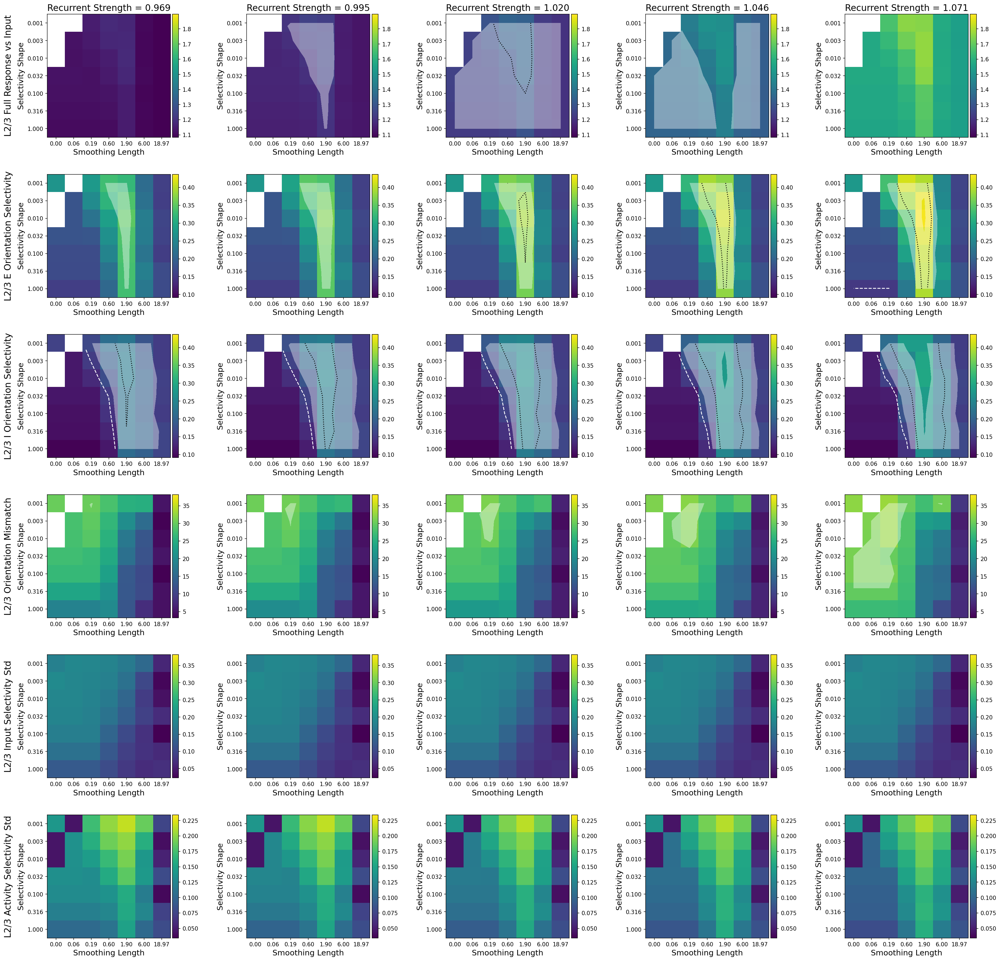

In [104]:
reload(pf)

responses_levels = np.array([1.2,1.3,1.4])
E_selects_levels = np.array([0.32,0.37,0.42])
I_selects_levels = np.array([0.17,0.22,0.27])
mismatches_levels = np.array([30,35,40])

fig,axs = plt.subplots(6,len(grecs),figsize=(6*len(grecs),30),dpi=150)
fig.subplots_adjust(hspace=.3, wspace=.5)

m_idx = 1

for g_idx,grec in enumerate(grecs):
    cbar = pf.imshowbar(fig,axs[0,g_idx],responses[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',#norm='log',
                 vmin=np.nanmin(responses),vmax=np.nanmax(responses))
    axs[0,g_idx].contourf(responses[:,:,g_idx,m_idx],levels=responses_levels[[0,-1]],colors='w',alpha=0.4)
    axs[0,g_idx].contour(responses[:,:,g_idx,m_idx],levels=responses_levels[1:2],colors='k',linestyles=':')
    axs[0,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[0,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[0,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[0,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[1,g_idx],E_selects[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[1,g_idx].contourf(E_selects[:,:,g_idx,m_idx],levels=E_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[1,g_idx].contour(E_selects[:,:,g_idx,m_idx],levels=E_selects_levels[1:2],colors='k',linestyles=':')
    axs[1,g_idx].contour(E_selects[:,:,g_idx,m_idx],levels=[0.15],colors='w',linestyles='--')
    axs[1,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[1,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[1,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[1,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[2,g_idx],I_selects[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[2,g_idx].contourf(I_selects[:,:,g_idx,m_idx],levels=I_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[2,g_idx].contour(I_selects[:,:,g_idx,m_idx],levels=I_selects_levels[1:2],colors='k',linestyles=':')
    axs[2,g_idx].contour(I_selects[:,:,g_idx,m_idx],levels=[0.15],colors='w',linestyles='--')
    axs[2,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[2,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[2,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[2,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[3,g_idx],mismatches[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(mismatches),vmax=np.nanmax(mismatches))
    axs[3,g_idx].contourf(mismatches[:,:,g_idx,m_idx],levels=mismatches_levels[[0,-1]],colors='w',alpha=0.4)
    axs[3,g_idx].contour(mismatches[:,:,g_idx,m_idx],levels=mismatches_levels[1:2],colors='k',linestyles=':')
    axs[3,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[3,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[3,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[3,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[4,g_idx],inp_sel_stds[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(inp_sel_stds),vmax=np.nanmax(inp_sel_stds))
#     axs[4,g_idx].contourf(inp_sel_stds[:,:,g_idx,m_idx],levels=inp_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[4,g_idx].contour(inp_sel_stds[:,:,g_idx,m_idx],levels=inp_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[4,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[4,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[4,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[4,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[5,g_idx],rate_sel_stds[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(rate_sel_stds),vmax=np.nanmax(rate_sel_stds))
#     axs[5,g_idx].contourf(rate_sel_stds[:,:,g_idx,m_idx],levels=rate_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[5,g_idx].contour(rate_sel_stds[:,:,g_idx,m_idx],levels=rate_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[5,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[5,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[5,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[5,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    axs[0,g_idx].set_title('Recurrent Strength = {:.3f}'.format(grec),fontsize=16)
    
pf.ytitle(axs[0,0],'L2/3 Full Response vs Input',xloc=-0.35,fontsize=16)
pf.ytitle(axs[1,0],'L2/3 E Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[2,0],'L2/3 I Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[3,0],'L2/3 Orientation Mismatch',xloc=-0.35,fontsize=16)
pf.ytitle(axs[4,0],'L2/3 Input Selectivity Std',xloc=-0.35,fontsize=16)
pf.ytitle(axs[5,0],'L2/3 Activity Selectivity Std',xloc=-0.35,fontsize=16)

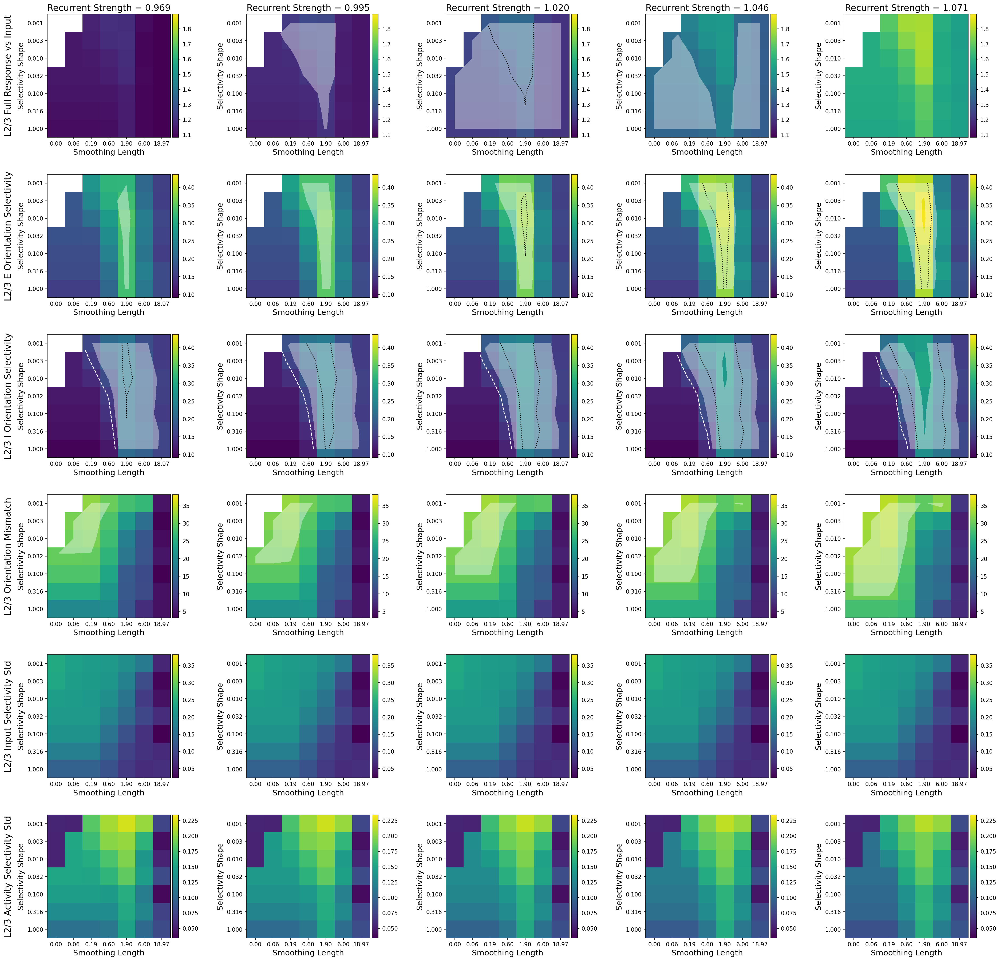

In [105]:
reload(pf)

responses_levels = np.array([1.2,1.3,1.4])
E_selects_levels = np.array([0.32,0.37,0.42])
I_selects_levels = np.array([0.17,0.22,0.27])
mismatches_levels = np.array([30,35,40])

fig,axs = plt.subplots(6,len(grecs),figsize=(6*len(grecs),30),dpi=150)
fig.subplots_adjust(hspace=.3, wspace=.5)

m_idx = 2

for g_idx,grec in enumerate(grecs):
    cbar = pf.imshowbar(fig,axs[0,g_idx],responses[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',#norm='log',
                 vmin=np.nanmin(responses),vmax=np.nanmax(responses))
    axs[0,g_idx].contourf(responses[:,:,g_idx,m_idx],levels=responses_levels[[0,-1]],colors='w',alpha=0.4)
    axs[0,g_idx].contour(responses[:,:,g_idx,m_idx],levels=responses_levels[1:2],colors='k',linestyles=':')
    axs[0,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[0,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[0,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[0,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[1,g_idx],E_selects[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[1,g_idx].contourf(E_selects[:,:,g_idx,m_idx],levels=E_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[1,g_idx].contour(E_selects[:,:,g_idx,m_idx],levels=E_selects_levels[1:2],colors='k',linestyles=':')
    axs[1,g_idx].contour(E_selects[:,:,g_idx,m_idx],levels=[0.15],colors='w',linestyles='--')
    axs[1,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[1,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[1,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[1,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[2,g_idx],I_selects[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[2,g_idx].contourf(I_selects[:,:,g_idx,m_idx],levels=I_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[2,g_idx].contour(I_selects[:,:,g_idx,m_idx],levels=I_selects_levels[1:2],colors='k',linestyles=':')
    axs[2,g_idx].contour(I_selects[:,:,g_idx,m_idx],levels=[0.15],colors='w',linestyles='--')
    axs[2,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[2,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[2,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[2,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[3,g_idx],mismatches[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(mismatches),vmax=np.nanmax(mismatches))
    axs[3,g_idx].contourf(mismatches[:,:,g_idx,m_idx],levels=mismatches_levels[[0,-1]],colors='w',alpha=0.4)
    axs[3,g_idx].contour(mismatches[:,:,g_idx,m_idx],levels=mismatches_levels[1:2],colors='k',linestyles=':')
    axs[3,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[3,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[3,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[3,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[4,g_idx],inp_sel_stds[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(inp_sel_stds),vmax=np.nanmax(inp_sel_stds))
#     axs[4,g_idx].contourf(inp_sel_stds[:,:,g_idx,m_idx],levels=inp_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[4,g_idx].contour(inp_sel_stds[:,:,g_idx,m_idx],levels=inp_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[4,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[4,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[4,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[4,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[5,g_idx],rate_sel_stds[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(rate_sel_stds),vmax=np.nanmax(rate_sel_stds))
#     axs[5,g_idx].contourf(rate_sel_stds[:,:,g_idx,m_idx],levels=rate_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[5,g_idx].contour(rate_sel_stds[:,:,g_idx,m_idx],levels=rate_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[5,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[5,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[5,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[5,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    axs[0,g_idx].set_title('Recurrent Strength = {:.3f}'.format(grec),fontsize=16)
    
pf.ytitle(axs[0,0],'L2/3 Full Response vs Input',xloc=-0.35,fontsize=16)
pf.ytitle(axs[1,0],'L2/3 E Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[2,0],'L2/3 I Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[3,0],'L2/3 Orientation Mismatch',xloc=-0.35,fontsize=16)
pf.ytitle(axs[4,0],'L2/3 Input Selectivity Std',xloc=-0.35,fontsize=16)
pf.ytitle(axs[5,0],'L2/3 Activity Selectivity Std',xloc=-0.35,fontsize=16)

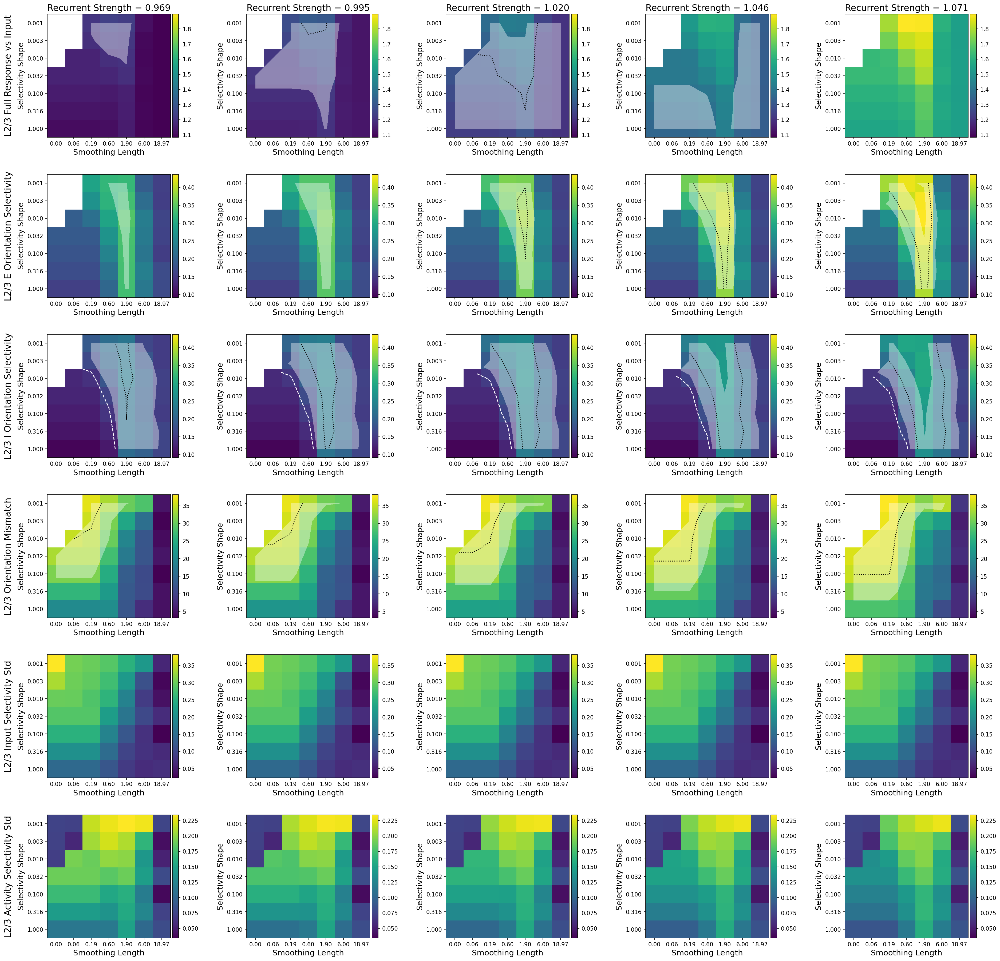

In [106]:
reload(pf)

responses_levels = np.array([1.2,1.3,1.4])
E_selects_levels = np.array([0.32,0.37,0.42])
I_selects_levels = np.array([0.17,0.22,0.27])
mismatches_levels = np.array([30,35,40])

fig,axs = plt.subplots(6,len(grecs),figsize=(6*len(grecs),30),dpi=150)
fig.subplots_adjust(hspace=.3, wspace=.5)

m_idx = 3

for g_idx,grec in enumerate(grecs):
    cbar = pf.imshowbar(fig,axs[0,g_idx],responses[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',#norm='log',
                 vmin=np.nanmin(responses),vmax=np.nanmax(responses))
    axs[0,g_idx].contourf(responses[:,:,g_idx,m_idx],levels=responses_levels[[0,-1]],colors='w',alpha=0.4)
    axs[0,g_idx].contour(responses[:,:,g_idx,m_idx],levels=responses_levels[1:2],colors='k',linestyles=':')
    axs[0,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[0,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[0,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[0,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[1,g_idx],E_selects[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[1,g_idx].contourf(E_selects[:,:,g_idx,m_idx],levels=E_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[1,g_idx].contour(E_selects[:,:,g_idx,m_idx],levels=E_selects_levels[1:2],colors='k',linestyles=':')
    axs[1,g_idx].contour(E_selects[:,:,g_idx,m_idx],levels=[0.15],colors='w',linestyles='--')
    axs[1,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[1,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[1,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[1,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[2,g_idx],I_selects[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[2,g_idx].contourf(I_selects[:,:,g_idx,m_idx],levels=I_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[2,g_idx].contour(I_selects[:,:,g_idx,m_idx],levels=I_selects_levels[1:2],colors='k',linestyles=':')
    axs[2,g_idx].contour(I_selects[:,:,g_idx,m_idx],levels=[0.15],colors='w',linestyles='--')
    axs[2,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[2,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[2,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[2,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[3,g_idx],mismatches[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(mismatches),vmax=np.nanmax(mismatches))
    axs[3,g_idx].contourf(mismatches[:,:,g_idx,m_idx],levels=mismatches_levels[[0,-1]],colors='w',alpha=0.4)
    axs[3,g_idx].contour(mismatches[:,:,g_idx,m_idx],levels=mismatches_levels[1:2],colors='k',linestyles=':')
    axs[3,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[3,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[3,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[3,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[4,g_idx],inp_sel_stds[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(inp_sel_stds),vmax=np.nanmax(inp_sel_stds))
#     axs[4,g_idx].contourf(inp_sel_stds[:,:,g_idx,m_idx],levels=inp_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[4,g_idx].contour(inp_sel_stds[:,:,g_idx,m_idx],levels=inp_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[4,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[4,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[4,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[4,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[5,g_idx],rate_sel_stds[:,:,g_idx,m_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(rate_sel_stds),vmax=np.nanmax(rate_sel_stds))
#     axs[5,g_idx].contourf(rate_sel_stds[:,:,g_idx,m_idx],levels=rate_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[5,g_idx].contour(rate_sel_stds[:,:,g_idx,m_idx],levels=rate_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[5,g_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[5,g_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[5,g_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[5,g_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    axs[0,g_idx].set_title('Recurrent Strength = {:.3f}'.format(grec),fontsize=16)
    
pf.ytitle(axs[0,0],'L2/3 Full Response vs Input',xloc=-0.35,fontsize=16)
pf.ytitle(axs[1,0],'L2/3 E Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[2,0],'L2/3 I Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[3,0],'L2/3 Orientation Mismatch',xloc=-0.35,fontsize=16)
pf.ytitle(axs[4,0],'L2/3 Input Selectivity Std',xloc=-0.35,fontsize=16)
pf.ytitle(axs[5,0],'L2/3 Activity Selectivity Std',xloc=-0.35,fontsize=16)

# Read results of SSN parameter scan

In [77]:
ksels = 10**np.linspace(-3,0,7)
lkers = np.concatenate(([0],10**np.linspace(-3,0,7)[:-1]))
grecs = np.round(1.02*np.linspace(0.95,1.05,5)[:4],4)
betxs = np.linspace(0.8,1.2,5)

inp_sel_stds = np.zeros((len(ksels),len(lkers),len(grecs),len(betxs)))
rate_sel_stds = np.zeros((len(ksels),len(lkers),len(grecs),len(betxs)))
responses = np.zeros((len(ksels),len(lkers),len(grecs),len(betxs)))
E_selects = np.zeros((len(ksels),len(lkers),len(grecs),len(betxs)))
I_selects = np.zeros((len(ksels),len(lkers),len(grecs),len(betxs)))
mismatches = np.zeros((len(ksels),len(lkers),len(grecs),len(betxs)))

for k_idx,ksel in enumerate(ksels):
    for l_idx,lker in enumerate(lkers):
        for g_idx,grec in enumerate(grecs):
            for b_idx,betx in enumerate(betxs):
                with open('./../results/L23_sel_ssn_ksel={:.3f}_lker={:.3f}_grec={:.3f}_betx={:.2f}_maxos={:.1f}/seed=0.pkl'.format(
                        ksel,lker,grec,betx,0.5), 'rb') as handle:
                    res_dict = pickle.load(handle)
                inp_sel_stds[k_idx,l_idx,g_idx,b_idx] = np.nanstd(res_dict['inp_r1']/res_dict['inp_r0'])
                if np.isinf(inp_sel_stds[k_idx,l_idx,g_idx,b_idx]):
                    inp_sel_stds[k_idx,l_idx,g_idx,b_idx] = np.nan
                rate_sel_stds[k_idx,l_idx,g_idx,b_idx] = np.nanstd(res_dict['rate_r1'][0]/res_dict['rate_r0'][0])
                if np.isinf(rate_sel_stds[k_idx,l_idx,g_idx,b_idx]):
                    rate_sel_stds[k_idx,l_idx,g_idx,b_idx] = np.nan
                responses[k_idx,l_idx,g_idx,b_idx] = np.nanmean(res_dict['rate_r0'][0]/res_dict['inp_r0'])
                if np.isinf(responses[k_idx,l_idx,g_idx,b_idx]):
                    responses[k_idx,l_idx,g_idx,b_idx] = np.nan
                E_selects[k_idx,l_idx,g_idx,b_idx] = res_dict['E_rate_OS']
                I_selects[k_idx,l_idx,g_idx,b_idx] = res_dict['I_rate_OS']
                mismatches[k_idx,l_idx,g_idx,b_idx] = 0.5*(res_dict['E_mismatch']+res_dict['I_mismatch'])

/usr/local/lib/python3.11/site-packages/matplotlib/image.py:455: RuntimeWarning: overflow encountered in scalar multiply
  newmin = vmid - dv * fact
/usr/local/lib/python3.11/site-packages/matplotlib/image.py:460: RuntimeWarning: overflow encountered in scalar multiply
  newmax = vmid + dv * fact


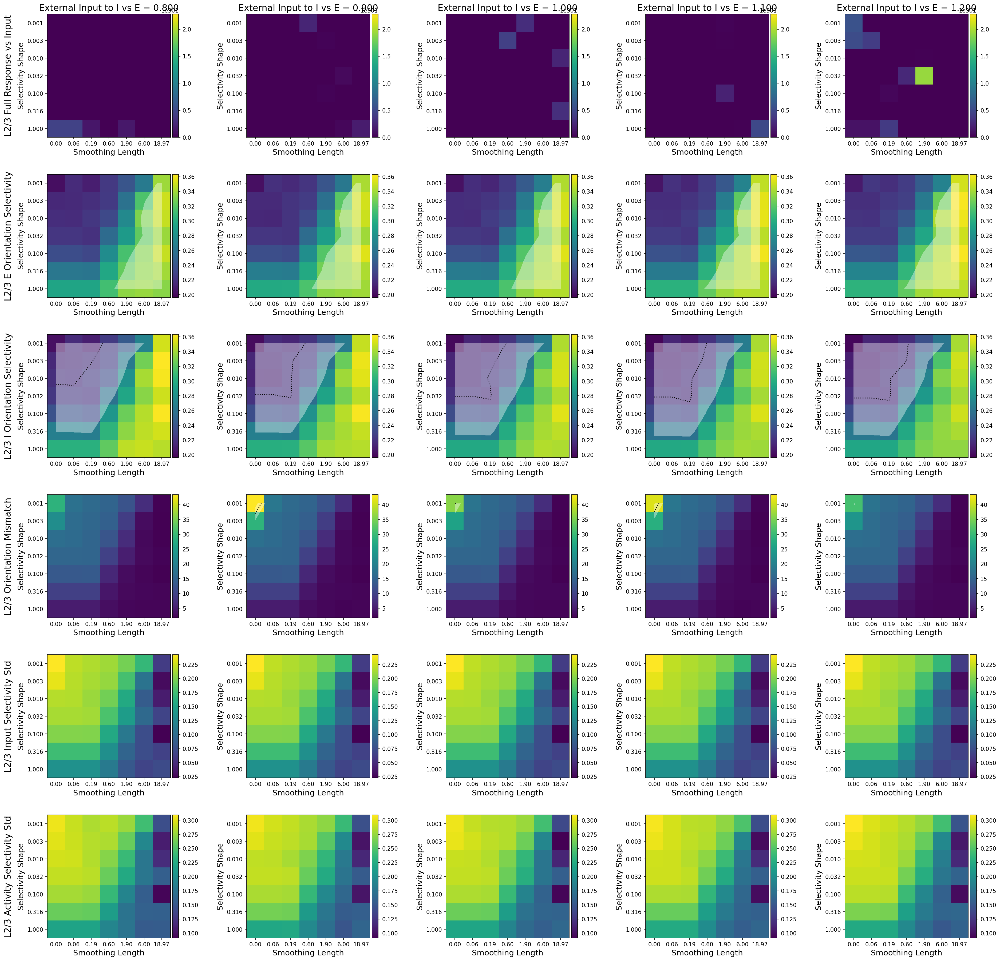

In [74]:
reload(pf)

responses_levels = np.array([1.2,1.3,1.4])
E_selects_levels = np.array([0.32,0.37,0.42])
I_selects_levels = np.array([0.17,0.22,0.27])
mismatches_levels = np.array([30,35,40])

fig,axs = plt.subplots(6,len(betxs),figsize=(6*len(betxs),30),dpi=150)
fig.subplots_adjust(hspace=.3, wspace=.5)

g_idx = 0
for b_idx,betx in enumerate(betxs):
    cbar = pf.imshowbar(fig,axs[0,b_idx],responses[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',#norm='log',
                 vmin=np.nanmin(responses),vmax=np.nanmax(responses))
    axs[0,b_idx].contourf(responses[:,:,g_idx,b_idx],levels=responses_levels[[0,-1]],colors='w',alpha=0.4)
    axs[0,b_idx].contour(responses[:,:,g_idx,b_idx],levels=responses_levels[1:2],colors='k',linestyles=':')
    axs[0,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[0,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[0,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[0,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[1,b_idx],E_selects[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[1,b_idx].contourf(E_selects[:,:,g_idx,b_idx],levels=E_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[1,b_idx].contour(E_selects[:,:,g_idx,b_idx],levels=E_selects_levels[1:2],colors='k',linestyles=':')
    axs[1,b_idx].contour(E_selects[:,:,g_idx,b_idx],levels=[0.15],colors='w',linestyles='--')
    axs[1,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[1,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[1,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[1,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[2,b_idx],I_selects[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[2,b_idx].contourf(I_selects[:,:,g_idx,b_idx],levels=I_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[2,b_idx].contour(I_selects[:,:,g_idx,b_idx],levels=I_selects_levels[1:2],colors='k',linestyles=':')
    axs[2,b_idx].contour(I_selects[:,:,g_idx,b_idx],levels=[0.15],colors='w',linestyles='--')
    axs[2,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[2,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[2,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[2,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[3,b_idx],mismatches[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(mismatches),vmax=np.nanmax(mismatches))
    axs[3,b_idx].contourf(mismatches[:,:,g_idx,b_idx],levels=mismatches_levels[[0,-1]],colors='w',alpha=0.4)
    axs[3,b_idx].contour(mismatches[:,:,g_idx,b_idx],levels=mismatches_levels[1:2],colors='k',linestyles=':')
    axs[3,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[3,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[3,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[3,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[4,b_idx],inp_sel_stds[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(inp_sel_stds),vmax=np.nanmax(inp_sel_stds))
#     axs[4,b_idx].contourf(inp_sel_stds[:,:,g_idx,b_idx],levels=inp_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[4,b_idx].contour(inp_sel_stds[:,:,g_idx,b_idx],levels=inp_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[4,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[4,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[4,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[4,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[5,b_idx],rate_sel_stds[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(rate_sel_stds),vmax=np.nanmax(rate_sel_stds))
#     axs[5,b_idx].contourf(rate_sel_stds[:,:,g_idx,b_idx],levels=rate_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[5,b_idx].contour(rate_sel_stds[:,:,g_idx,b_idx],levels=rate_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[5,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[5,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[5,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[5,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    axs[0,b_idx].set_title('External Input to I vs E = {:.3f}'.format(betx),fontsize=16)
    
pf.ytitle(axs[0,0],'L2/3 Full Response vs Input',xloc=-0.35,fontsize=16)
pf.ytitle(axs[1,0],'L2/3 E Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[2,0],'L2/3 I Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[3,0],'L2/3 Orientation Mismatch',xloc=-0.35,fontsize=16)
pf.ytitle(axs[4,0],'L2/3 Input Selectivity Std',xloc=-0.35,fontsize=16)
pf.ytitle(axs[5,0],'L2/3 Activity Selectivity Std',xloc=-0.35,fontsize=16)

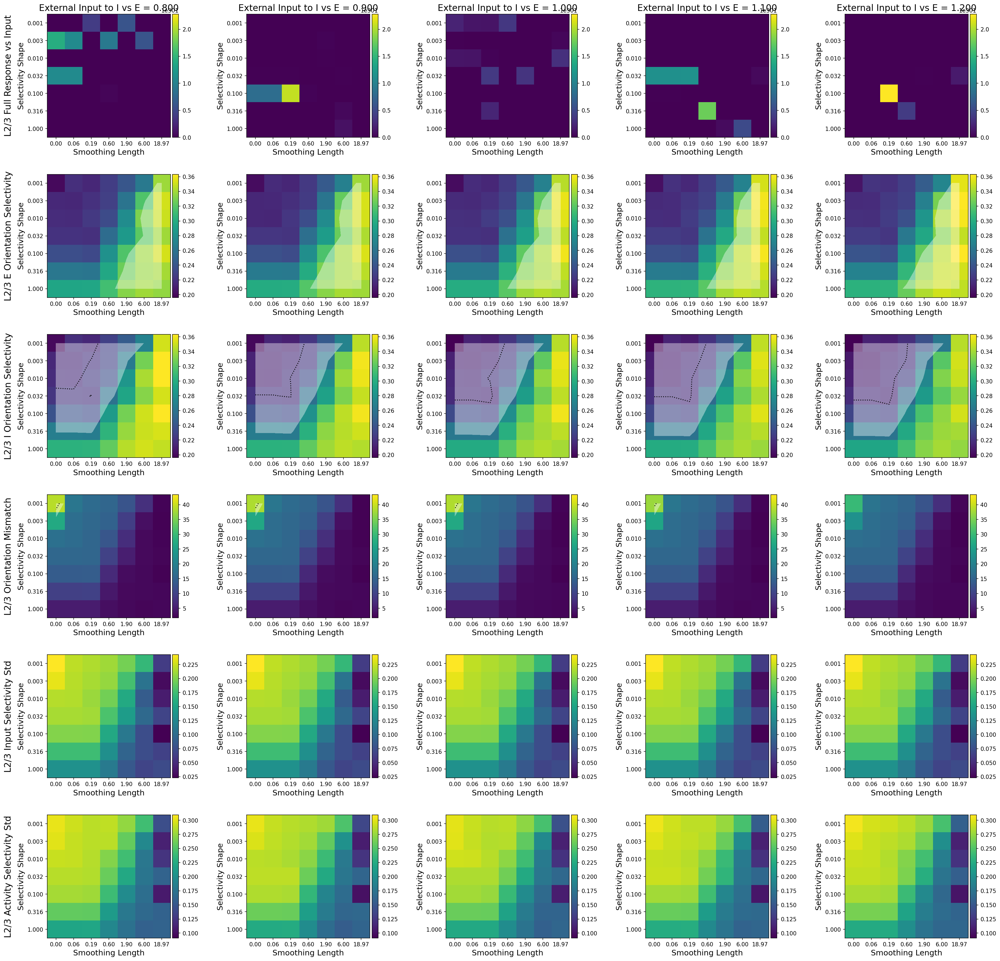

In [75]:
reload(pf)

responses_levels = np.array([1.2,1.3,1.4])
E_selects_levels = np.array([0.32,0.37,0.42])
I_selects_levels = np.array([0.17,0.22,0.27])
mismatches_levels = np.array([30,35,40])

fig,axs = plt.subplots(6,len(betxs),figsize=(6*len(betxs),30),dpi=150)
fig.subplots_adjust(hspace=.3, wspace=.5)

g_idx = 1
for b_idx,betx in enumerate(betxs):
    cbar = pf.imshowbar(fig,axs[0,b_idx],responses[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',#norm='log',
                 vmin=np.nanmin(responses),vmax=np.nanmax(responses))
    axs[0,b_idx].contourf(responses[:,:,g_idx,b_idx],levels=responses_levels[[0,-1]],colors='w',alpha=0.4)
    axs[0,b_idx].contour(responses[:,:,g_idx,b_idx],levels=responses_levels[1:2],colors='k',linestyles=':')
    axs[0,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[0,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[0,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[0,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[1,b_idx],E_selects[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[1,b_idx].contourf(E_selects[:,:,g_idx,b_idx],levels=E_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[1,b_idx].contour(E_selects[:,:,g_idx,b_idx],levels=E_selects_levels[1:2],colors='k',linestyles=':')
    axs[1,b_idx].contour(E_selects[:,:,g_idx,b_idx],levels=[0.15],colors='w',linestyles='--')
    axs[1,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[1,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[1,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[1,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[2,b_idx],I_selects[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[2,b_idx].contourf(I_selects[:,:,g_idx,b_idx],levels=I_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[2,b_idx].contour(I_selects[:,:,g_idx,b_idx],levels=I_selects_levels[1:2],colors='k',linestyles=':')
    axs[2,b_idx].contour(I_selects[:,:,g_idx,b_idx],levels=[0.15],colors='w',linestyles='--')
    axs[2,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[2,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[2,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[2,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[3,b_idx],mismatches[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(mismatches),vmax=np.nanmax(mismatches))
    axs[3,b_idx].contourf(mismatches[:,:,g_idx,b_idx],levels=mismatches_levels[[0,-1]],colors='w',alpha=0.4)
    axs[3,b_idx].contour(mismatches[:,:,g_idx,b_idx],levels=mismatches_levels[1:2],colors='k',linestyles=':')
    axs[3,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[3,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[3,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[3,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[4,b_idx],inp_sel_stds[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(inp_sel_stds),vmax=np.nanmax(inp_sel_stds))
#     axs[4,b_idx].contourf(inp_sel_stds[:,:,g_idx,b_idx],levels=inp_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[4,b_idx].contour(inp_sel_stds[:,:,g_idx,b_idx],levels=inp_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[4,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[4,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[4,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[4,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[5,b_idx],rate_sel_stds[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(rate_sel_stds),vmax=np.nanmax(rate_sel_stds))
#     axs[5,b_idx].contourf(rate_sel_stds[:,:,g_idx,b_idx],levels=rate_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[5,b_idx].contour(rate_sel_stds[:,:,g_idx,b_idx],levels=rate_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[5,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[5,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[5,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[5,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    axs[0,b_idx].set_title('External Input to I vs E = {:.3f}'.format(betx),fontsize=16)
    
pf.ytitle(axs[0,0],'L2/3 Full Response vs Input',xloc=-0.35,fontsize=16)
pf.ytitle(axs[1,0],'L2/3 E Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[2,0],'L2/3 I Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[3,0],'L2/3 Orientation Mismatch',xloc=-0.35,fontsize=16)
pf.ytitle(axs[4,0],'L2/3 Input Selectivity Std',xloc=-0.35,fontsize=16)
pf.ytitle(axs[5,0],'L2/3 Activity Selectivity Std',xloc=-0.35,fontsize=16)

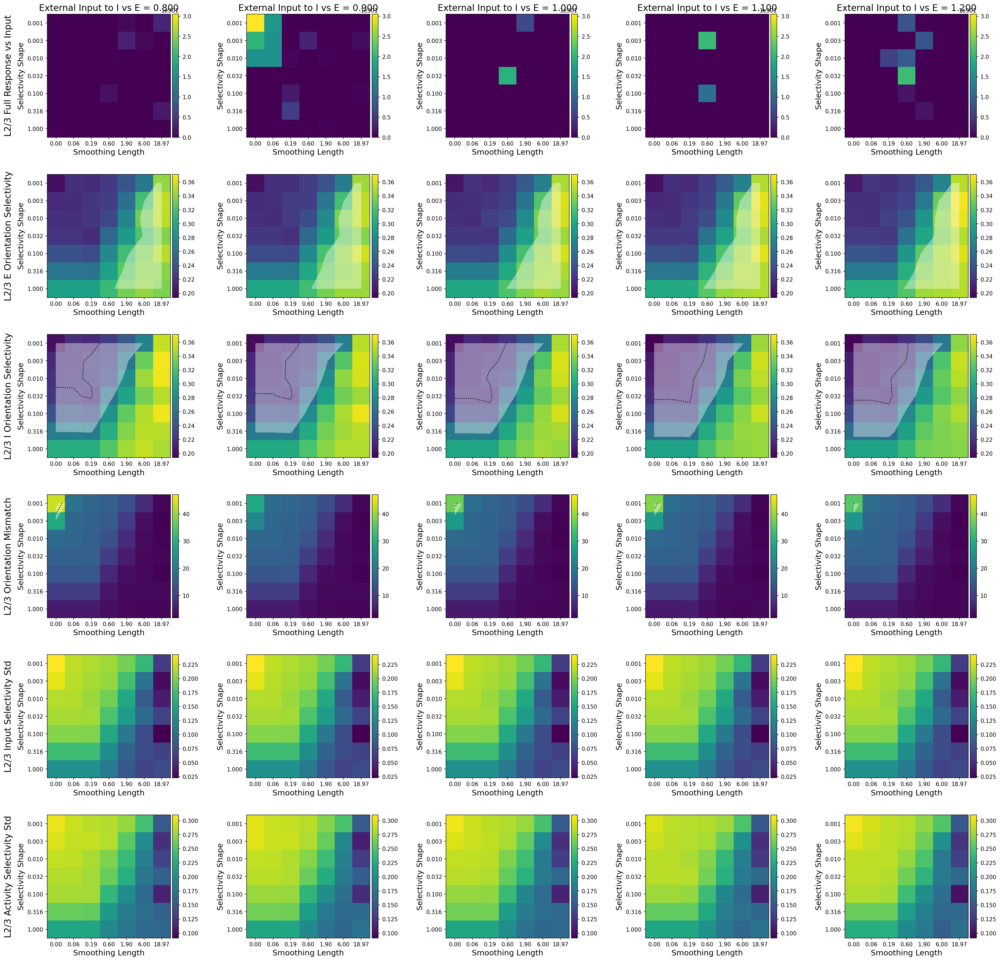

In [78]:
reload(pf)

responses_levels = np.array([1.2,1.3,1.4])
E_selects_levels = np.array([0.32,0.37,0.42])
I_selects_levels = np.array([0.17,0.22,0.27])
mismatches_levels = np.array([30,35,40])

fig,axs = plt.subplots(6,len(betxs),figsize=(6*len(betxs),30),dpi=150)
fig.subplots_adjust(hspace=.3, wspace=.5)

g_idx = 2
for b_idx,betx in enumerate(betxs):
    cbar = pf.imshowbar(fig,axs[0,b_idx],responses[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',#norm='log',
                 vmin=np.nanmin(responses),vmax=np.nanmax(responses))
    axs[0,b_idx].contourf(responses[:,:,g_idx,b_idx],levels=responses_levels[[0,-1]],colors='w',alpha=0.4)
    axs[0,b_idx].contour(responses[:,:,g_idx,b_idx],levels=responses_levels[1:2],colors='k',linestyles=':')
    axs[0,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[0,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[0,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[0,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[1,b_idx],E_selects[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[1,b_idx].contourf(E_selects[:,:,g_idx,b_idx],levels=E_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[1,b_idx].contour(E_selects[:,:,g_idx,b_idx],levels=E_selects_levels[1:2],colors='k',linestyles=':')
    axs[1,b_idx].contour(E_selects[:,:,g_idx,b_idx],levels=[0.15],colors='w',linestyles='--')
    axs[1,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[1,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[1,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[1,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[2,b_idx],I_selects[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(I_selects),vmax=np.nanmax(E_selects))
    axs[2,b_idx].contourf(I_selects[:,:,g_idx,b_idx],levels=I_selects_levels[[0,-1]],colors='w',alpha=0.4)
    axs[2,b_idx].contour(I_selects[:,:,g_idx,b_idx],levels=I_selects_levels[1:2],colors='k',linestyles=':')
    axs[2,b_idx].contour(I_selects[:,:,g_idx,b_idx],levels=[0.15],colors='w',linestyles='--')
    axs[2,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[2,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[2,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[2,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[3,b_idx],mismatches[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(mismatches),vmax=np.nanmax(mismatches))
    axs[3,b_idx].contourf(mismatches[:,:,g_idx,b_idx],levels=mismatches_levels[[0,-1]],colors='w',alpha=0.4)
    axs[3,b_idx].contour(mismatches[:,:,g_idx,b_idx],levels=mismatches_levels[1:2],colors='k',linestyles=':')
    axs[3,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[3,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[3,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[3,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[4,b_idx],inp_sel_stds[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(inp_sel_stds),vmax=np.nanmax(inp_sel_stds))
#     axs[4,b_idx].contourf(inp_sel_stds[:,:,g_idx,b_idx],levels=inp_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[4,b_idx].contour(inp_sel_stds[:,:,g_idx,b_idx],levels=inp_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[4,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[4,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[4,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[4,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    pf.imshowbar(fig,axs[5,b_idx],rate_sel_stds[:,:,g_idx,b_idx],hide_ticks=False,cmap='viridis',
                 vmin=np.nanmin(rate_sel_stds),vmax=np.nanmax(rate_sel_stds))
#     axs[5,b_idx].contourf(rate_sel_stds[:,:,g_idx,b_idx],levels=rate_sel_stds_levels[[0,-1]],colors='w',alpha=0.4)
#     axs[5,b_idx].contour(rate_sel_stds[:,:,g_idx,b_idx],levels=rate_sel_stds_levels[1:2],colors='k',linestyles=':')
    axs[5,b_idx].set_xticks(np.arange(len(lkers)),['{:.2f}'.format(lker*N4) for lker in lkers],fontsize=10)
    axs[5,b_idx].set_yticks(np.arange(len(ksels)),['{:.3f}'.format(ksel) for ksel in ksels],fontsize=10)
    axs[5,b_idx].set_xlabel('Smoothing Length',fontsize=14)
    axs[5,b_idx].set_ylabel('Selectivity Shape',fontsize=14)
    
    axs[0,b_idx].set_title('External Input to I vs E = {:.3f}'.format(betx),fontsize=16)
    
pf.ytitle(axs[0,0],'L2/3 Full Response vs Input',xloc=-0.35,fontsize=16)
pf.ytitle(axs[1,0],'L2/3 E Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[2,0],'L2/3 I Orientation Selectivity',xloc=-0.35,fontsize=16)
pf.ytitle(axs[3,0],'L2/3 Orientation Mismatch',xloc=-0.35,fontsize=16)
pf.ytitle(axs[4,0],'L2/3 Input Selectivity Std',xloc=-0.35,fontsize=16)
pf.ytitle(axs[5,0],'L2/3 Activity Selectivity Std',xloc=-0.35,fontsize=16)

# Investigate beta distributed selectivities

In [181]:
def gen_sp_beta_opm(mean_OS,std_OS,max_OX=np.pi/4,seed=0):
    rng = np.random.default_rng(seed)
    
    a = (mean_OS*(max_OX-mean_OS)/std_OS**2 - 1) * mean_OS
    b = (mean_OS*(max_OX-mean_OS)/std_OS**2 - 1) * (max_OX-mean_OS)
    
    z = np.exp(1j*2*np.pi*rng.random(size=(N4,N4)))
    z *= rng.beta(a=a,b=b,size=(N4,N4)) * max_OX
    
    return z

In [187]:
mean_OS = 0.15
std_OS = 0.3

L4_z = gen_sp_beta_opm(mean_OS,std_OS)

Text(0.5, 1.0, 'Selectivities')

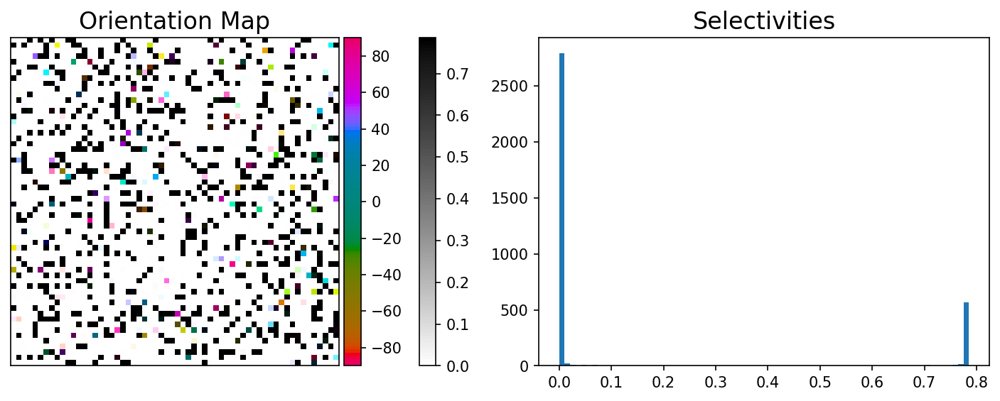

In [188]:
fig,axs = plt.subplots(1,2,figsize=(12,4),dpi=150)

pf.domcolbar(fig,axs[0],L4_z,origin='lower',alim=[-90,90],rlim=[0,np.pi/4],zorder=0)
axs[1].hist(np.abs(L4_z).flatten(),np.linspace(0,np.pi/4,76))

axs[0].set_title('Orientation Map',fontsize=16)
axs[1].set_title('Selectivities',fontsize=16)

# Add explicit arbors from L4 to L2/3

In [57]:
k = 0.002
avg_OS = 0.15

orig_z = gen_sp_opm(0.15,k)

lker = 0.005
lker2 = lker**2

if lker != 0.0:
    gauss = np.exp(-0.5*ds2/lker2)
    
    z = np.einsum('ijkl,kl->ij',gauss,orig_z * inv_OS_itp(np.abs(orig_z)) / np.fmax(1e-12,np.abs(orig_z)))
    
    while np.abs(np.mean(clip_OS(np.abs(z))) - avg_OS) > 1e-3:
        z *= 1 - (np.mean(clip_OS(np.abs(z))) - avg_OS)
#         print(np.abs(np.mean(clip_OS(np.abs(z))) - avg_OS))
    
    z *= clip_OS(np.abs(z)) / np.abs(z)

In [58]:
lker = 0.01
lker2 = lker**2

W4to23 = np.exp(-0.5*ds2/lker2) / (2*np.pi*lker2*N4**2)
Wz = np.einsum('ijkl,kl->ij',W4to23,z)

Text(0.5, 1.0, 'L2/3 Input Selectivities')

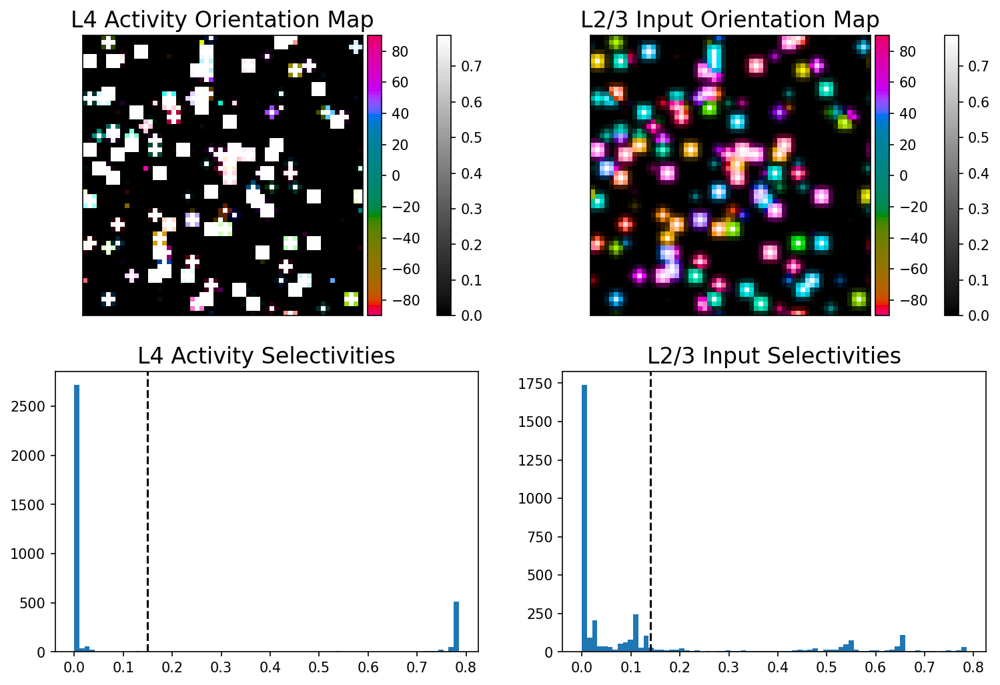

In [59]:
fig,axs = plt.subplots(2,2,figsize=(12,8),dpi=150)

pf.domcolbar(fig,axs[0,0],z,origin='lower',alim=[-90,90],rlim=[0,np.pi/4])
pf.domcolbar(fig,axs[0,1],Wz,origin='lower',alim=[-90,90],rlim=[0,np.pi/4])
axs[1,0].hist(np.abs(z).flatten(),np.linspace(0,np.pi/4,76))
axs[1,0].axvline(np.mean(np.abs(z)),c='k',ls='--')
axs[1,1].hist(np.abs(Wz).flatten(),np.linspace(0,np.pi/4,76))
axs[1,1].axvline(np.mean(np.abs(Wz)),c='k',ls='--')

axs[0,0].set_title('L4 Activity Orientation Map',fontsize=16)
axs[0,1].set_title('L2/3 Input Orientation Map',fontsize=16)
axs[1,0].set_title('L4 Activity Selectivities',fontsize=16)
axs[1,1].set_title('L2/3 Input Selectivities',fontsize=16)

In [58]:
n_inp = 2000
eta = 0.003
gam_rec = 1.02
oris = np.arange(n_inp)/n_inp * 180
inps = np.zeros((n_inp,N4,N4))

# ring_image = np.fft.fftshift(gen_gaussian_random_field.generate_ring(N4,N4,0,N4/4))

rng = np.random.default_rng(0)
for inp_idx in range(n_inp):
    ori = oris[inp_idx]
    inps[inp_idx,:,:] = np.fmax(0,1 + 2*eta *\
                                        np.real(np.exp(-1j*ori*2*np.pi/180) * L4_z) / np.mean(np.abs(L4_z)))
#     scale = avg_FF
#     shape = mean_resp/avg_FF
#     for pop_idx in range(2):
#         inps[inp_idx,pop_idx,:,:] = rng.gamma(shape=shape,scale=scale)

In [59]:
r0 = np.mean(inps,0)
r1 = np.sqrt(np.mean(np.sin(oris*2*np.pi/180)[:,None,None]*inps,0)**2 +\
        np.mean(np.cos(oris*2*np.pi/180)[:,None,None]*inps,0)**2)
print('Avg OS =',np.mean(r1/r0) / eta)

rm = np.mean(inps,0)
rV = np.var(inps,0)
print('Avg FF =',np.mean(rV/rm) / eta**2)

Avg OS = 1.0000000000000049
Avg FF = 22.883733165225983


(array([3.315e+03, 2.300e+01, 1.500e+01, 1.200e+01, 7.000e+00, 3.000e+00,
        4.000e+00, 5.000e+00, 3.000e+00, 4.000e+00, 3.000e+00, 1.000e+00,
        3.000e+00, 2.000e+00, 2.000e+00, 1.000e+00, 4.000e+00, 2.000e+00,
        2.000e+00, 1.000e+00, 3.000e+00, 0.000e+00, 0.000e+00, 1.000e+00,
        2.000e+00, 4.000e+00, 3.000e+00, 2.000e+00, 2.000e+00, 1.000e+00,
        1.000e+00, 2.000e+00, 1.000e+00, 1.000e+00, 1.000e+00, 2.000e+00,
        1.000e+00, 3.000e+00, 4.000e+00, 2.000e+00, 3.000e+00, 4.000e+00,
        1.000e+01, 5.000e+00, 3.000e+00, 7.000e+00, 5.000e+00, 1.800e+01,
        1.800e+01, 7.900e+01]),
 array([0.        , 0.01569398, 0.03138796, 0.04708193, 0.06277591,
        0.07846989, 0.09416387, 0.10985784, 0.12555182, 0.1412458 ,
        0.15693978, 0.17263375, 0.18832773, 0.20402171, 0.21971569,
        0.23540966, 0.25110364, 0.26679762, 0.2824916 , 0.29818558,
        0.31387955, 0.32957353, 0.34526751, 0.36096149, 0.37665546,
        0.39234944, 0.40804342, 0.42

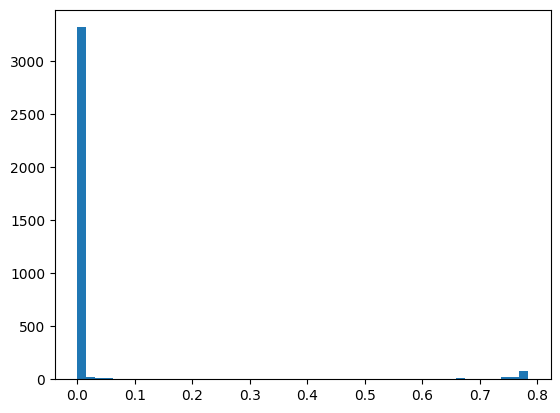

In [156]:
plt.hist(clip_OS_xform(np.abs(L4_z)).flatten(),50)

## Look at transformation of OS depending on k and l

In [315]:
10**np.linspace(-3,0,7)

array([0.001     , 0.00316228, 0.01      , 0.03162278, 0.1       ,
       0.31622777, 1.        ])

In [340]:
np.concatenate(([0],10**np.linspace(-3,0,7)[:-1]))

array([0.        , 0.001     , 0.00316228, 0.01      , 0.03162278,
       0.1       , 0.31622777])

In [349]:
1.02*10**np.linspace(-0.2,0.2,5)

array([0.64357649, 0.8102148 , 1.02      , 1.28410392, 1.61659106])

In [73]:
ks = 10**np.linspace(-2,1,7)
ls = 10**np.linspace(-2,0,7)

L4_r1s = np.zeros((len(ks),len(ls)))
L4_rVs = np.zeros((len(ks),len(ls)))
L23_r1s = np.zeros((len(ks),len(ls)))
L23_rVs = np.zeros((len(ks),len(ls)))

n_inp = 2000

eta = 0.001
oris = np.arange(n_inp)/n_inp * 180
L4_act = np.zeros((n_inp,N4,N4))
L23_act = np.zeros((n_inp,N4,N4))

for k_idx,k in enumerate(ks):
    L4_z = gen_sp_opm(k)
    
    rng = np.random.default_rng(0)
    for inp_idx in range(n_inp):
        ori = oris[inp_idx]
        L4_act[inp_idx,:,:] = 1 + 2*eta *\
                                    np.real(np.exp(-1j*ori*2*np.pi/180) * L4_z) / np.mean(np.abs(L4_z))
    for l_idx,l in enumerate(ls):
        W4to23 = np.exp(-0.5*ds2/l**2) / (2*np.pi*l**2*N4**2)
        for inp_idx in range(n_inp):
            L23_act[inp_idx,:,:] = np.einsum('ijkl,kl->ij',W4to23,L4_act[inp_idx,:,:])
            
        L4_r1s[k_idx,l_idx] = np.mean(np.sqrt(np.mean(np.sin(oris*2*np.pi/180)[:,None,None]*L4_act,0)**2 +\
                np.mean(np.cos(oris*2*np.pi/180)[:,None,None]*L4_act,0)**2)) / eta
        L4_rVs[k_idx,l_idx] = np.mean(np.var(L4_act,0)) / eta**2
        L23_r1s[k_idx,l_idx] = np.mean(np.sqrt(np.mean(np.sin(oris*2*np.pi/180)[:,None,None]*L23_act,0)**2 +\
                np.mean(np.cos(oris*2*np.pi/180)[:,None,None]*L23_act,0)**2)) / eta
        L23_rVs[k_idx,l_idx] = np.mean(np.var(L23_act,0)) / eta**2

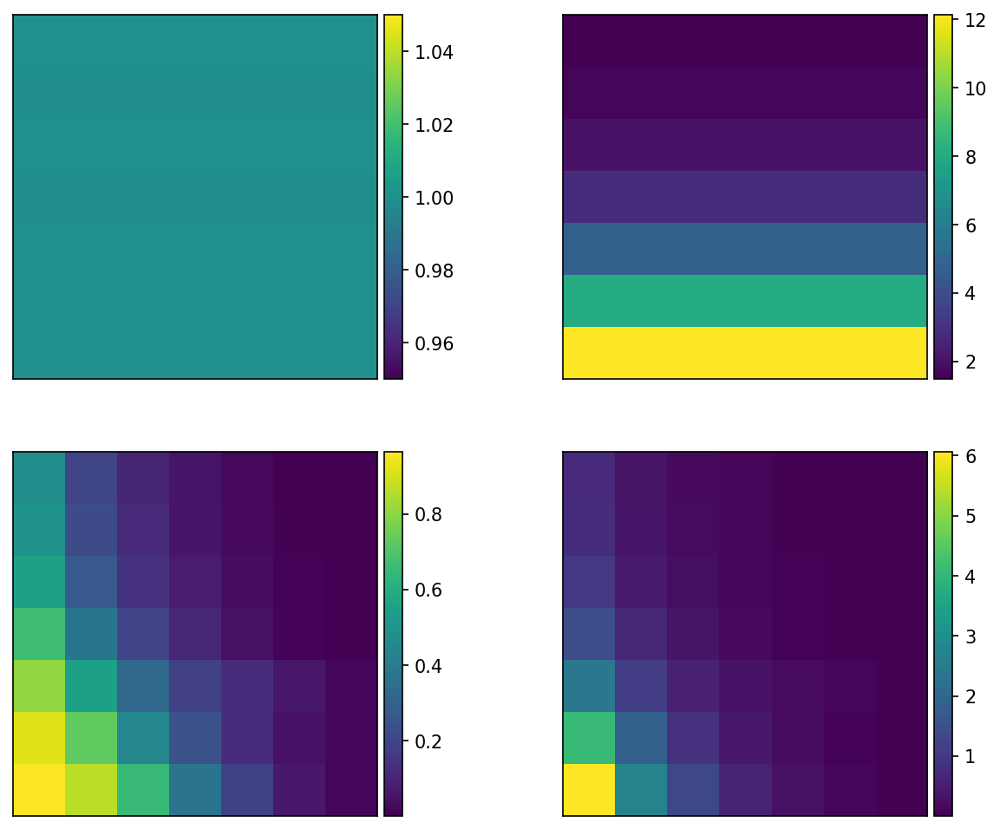

In [74]:
fig,axs = plt.subplots(2,2,figsize=(10,8),dpi=150)

pf.imshowbar(fig,axs[0,0],L4_r1s,origin='lower',cmap='viridis',vmin=0.95,vmax=1.05)
pf.imshowbar(fig,axs[0,1],np.sqrt(L4_rVs),origin='lower',cmap='viridis')
pf.imshowbar(fig,axs[1,0],L23_r1s,origin='lower',cmap='viridis')
pf.imshowbar(fig,axs[1,1],np.sqrt(L23_rVs),origin='lower',cmap='viridis')

# axs[0].set_title('L4 Activity Orientation Map',fontsize=16)
# axs[1].set_title('L2/3 Input Orientation Map',fontsize=16)